# **Deep Learning (Foundations): Course Project**

## **Classifcation with BACH's dataset ( breast cancer histology images)**

**Group Registration**

|      |     Student Name           |        Student e-mail             | 
|---   |         ---                |                  ---              |
| 1    |      Ana Carolina Ottavi   |       20220541@novaims.unl.pt     | 
| 2    |      Leonardo Teles        |       20220615@novaims.unl.pt     | 
| 3    |      Carolina Bezerra      |       20220392@novaims.unl.pt     | 
| 4    |      Sabeen Mubashar       |       20220726@novaims.unl.pt     |
| 5    |      Maria Arbelaez        |       20221381@novaims.unl.pt     | 

**Data Source**

Note that the original data was not organized in trainning and test folders, therefore we performed this organization ourselves. The dataset contained 400 images (100 images per class) and we decided to put 40 images in the test folder (10 images per class) and leave the remaining 360 images for trainning.

Ready-to-use data: https://drive.google.com/file/d/1QUV4G1fUV3GCeby3cUhSVCC_sBy6m2SS/view?usp=sharing

Original data: BACH dataset. (2019). CC BY-NC-ND. Retrieved from https://drive.google.com/file/d/1_HWnQT3UN9iAQEjMc9xP-dIxfOwVx7Fb/view?usp=share_link linked in https://github.com/bupt-ai-cz/BreastCancerCNN

Guilherme Aresta, Teresa Araújo, Scotty Kwok, Sai Saketh Chennamsetty, Mohammed Safwan, Varghese Alex, Bahram Marami, Marcel Prastawa, Monica Chan, Michael Donovan, Gerardo Fernandez, Jack Zeineh, Matthias Kohl, Christoph Walz, Florian Ludwig, Stefan Braunewell, Maximilian Baust, Quoc Dang Vu, Minh Nguyen Nhat To, Eal Kim, Jin Tae Kwak, Sameh Galal, Veronica Sanchez-Freire, Nadia Brancati, Maria Frucci, Daniel Riccio, Yaqi Wang, Lingling Sun, Kaiqiang Ma, Jiannan Fang, Ismael Kone, Lahsen Boulmane, Aurélio Campilho, Catarina Eloy, António Polónia, Paulo Aguiar,

BACH: Grand challenge on breast cancer histology images,
Medical Image Analysis,
Volume 56,
2019,
Pages 122-139,
ISSN 1361-8415,

https://doi.org/10.1016/j.media.2019.05.010.

(https://www.sciencedirect.com/science/article/pii/S1361841518307941)

**Dataset Description**

Microscopy images are labelled as normal, benign, in situ carcinoma or invasive carcinoma according to the predominant cancer type in each image. The annotation was performed by two medical experts and images where there was disagreement were discarded.

The dataset contains a total of 400 microscopy images, distributed as follows:
- Normal: 100
- Benign: 100
- in situ carcinoma: 100
- Invasive carcinoma: 100

Microscopy images are on .tiff format and have the following specifications:
- Color model: R(ed)G(reen)B(lue)
- Size: 2048 x 1536 pixels
- Pixel scale: 0.42 µm x 0.42 µm
- Memory space: 10-20 MB (approx.)
- Type of label: image-wise

# **Summary of Main Steps and Findings in Exploration**

- For the exploration of the dataset the following steps were taken:
 - Visualization of random batches of images per class.
 - Confirmation of dataset balance.
 - Visualization of the average image per class and contrast of average Normal class image versus the average image of the three remaining classes. 
- The main findigs where:
 - The dataset only contains 400 images, this might represent a problem for the performance of the models, hence data augmentation will be explored in the models. 
 - The dataset is balanced, containing the same number of samples per class.
 - The images file extention is .tif which is not supported by keras, therefore it will be converted to .png. 
 - The color mode of the images is RGB.
 - The size of the images is quite large (2048 x 1536 pixels), therefore resizing will be required in the preprocessing for the sake of computational resources.
 - All images are of the same size and aspect ratio, thus no cropping will be needed.
 - Some patterns where found regarding pixel values of the images per class.





# **Summary of Main Steps and Findings in Preprocessing**

- For the preprocessing of the dataset the following steps where taken:
 - image resizing
 - one hot encoding of labels
 - pixel normalization
 - definition of image augmentation pipeline


# **Summary of Main Steps and Findings in Handcrafted Models**

For the building of the handcrafted models the following steps where taken:
- Two simple baseline models with one convolutional layer, one MaxPooling layer and one dense hidden layer where built, one with image augmentation and one without.
- 7 more complex models where built sequientially, each of them taking into account the performances and improvement needs of the previous one.
- Adam was our choice of optimizer given that it is currently the most popular optimizer used for CNN models.
- The starting learning rate selected was 0.001. 
- To assess the models we checked the categorical accuracy in trainning, validation and test sets.

The main findigs where:
- Both baseline models underperform with accuracies of ~25% in trainning, validation and test sets, which is expected from a random baseline model.
- The first complex model (Model 2) almost doubled the accuracy scores just by adding more complexity to its architecture: 
   - we added two additional convolutional layers, each one of them with subsequent MaxPooling layers.
   - we increased the filter sizes from 3x3 to 5x5.
   - we increased the strides from 1 to 2 to prevent the number of trainable parameters to grow too much.
   - we added and aditional dense hidden layer.
   - we increased the number of neurons in both dense hidden layers.
- Since the first complex model was still underfitting, we decided to try three different strategies hoping to improve this:
   - First we tried adding two more  convolutional layers before the last MaxPooling layer (Model 3A). This new arquitecture lowered the accuracy scores again to the same level as the baseline models.
   - Secondly we tried increasing the number of filters (Model 3B) and achieved similar results from Model 2.
   - Third, we decreased the learning rate under the hypothesis that maybe the optimizer was skipping the optimal solution (Model 3C). With this model we achieved better accuracy scores both in trainning and validation and slightly better results in test set, but now the model was overfitting. 
- In order to reduce overffiting we tried three strategies as well:
 - Adding one dropout layer after the second dense hidden layer (Model 4A) and adding two dropout layers each one after each dense hidden layer (Model 4B). The first one achieved similar results in train and validation sets as Model 3C but improved the results in test set. The secon one, kept the ~20% difference between train and validation scores, but worsened them compared to Model 3C, although it slightly improved the accuracy in the test set.
 - Applying image augmentation (Model 4C). lowered the accuracy scores again to the same level as the baseline models.
- Based on these results we decided to advance to hyperparamet tunning with model 4A. Without hypertuning this model achieves the following performance in the test set: 
 - Test Categorical Accuracy: 0.550000011920929
 - Test AUROC: 0.7655208110809326


Baseline Models

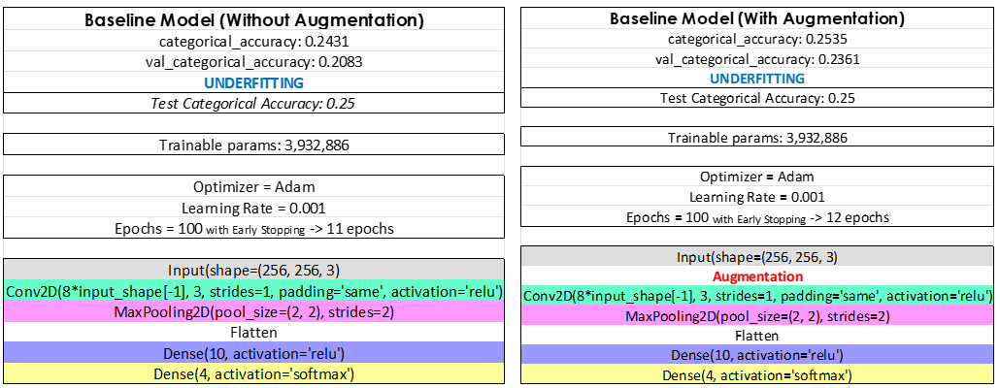

Model 2

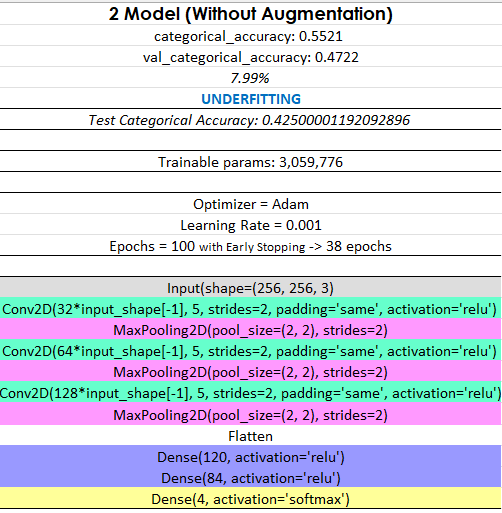

Models 3A, 3B and 3C

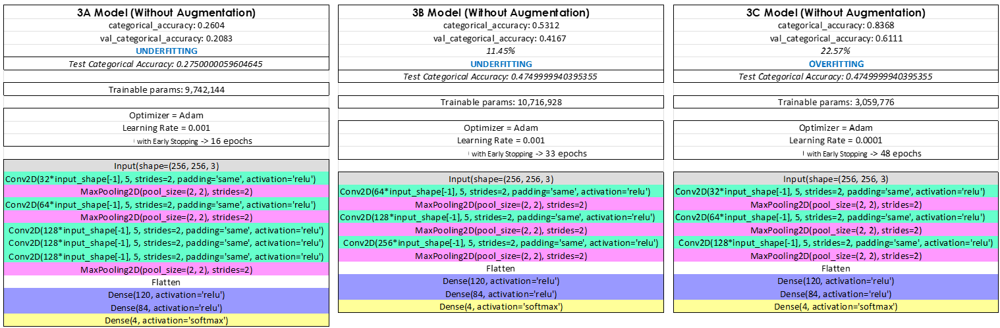

Models 4A, 4B and 4C

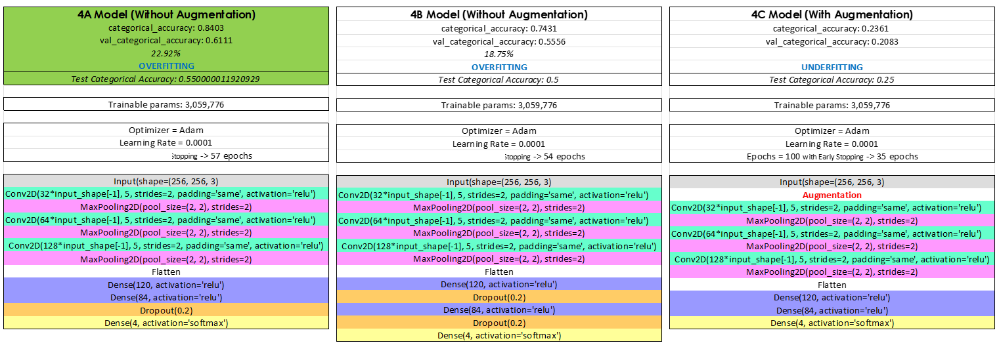

# **Summary of Main Steps and Findings in Hyperparameter Tunning**

For hyper parameter tunning we decided to use Bayesian Optimization given our large search space and limitations in computational power. Unlike Random Search and Hyperband that choose the hyperparameter combintions randomly, this tuner first chooses a few combinations randomly and based on their performance it chooses the next best possible sets of hyperparameters. This means it takes into account the history of the hyperparameters which were tried, giving us a higher chance of achieving optimal hyperparameters. 

Source: https://medium.com/swlh/hyperparameter-tuning-in-keras-tensorflow-2-with-keras-tuner-randomsearch-hyperband-3e212647778f

Based on Model 4A, we decided to try these different values for the following parameters:
- Number of filters: 32 to 256 in steps of 32
- Filter size: 3x3, 5x5 and 11x11
- Strides: 1 and 2
- Padding: same and valid
- Number of nodes in hidden layers: 64 to 512 in steps of 64
- Activation functions: Relu and Sigmoid
- Learning rate: 0.0001 to 0.01
- Optimizer: Adam, RMSprop and SGD

Our objective with Bayesian Optimization was to achieve the highest possible validation accuracy. We did 100 trials with 50 epochs each. 

The two best models obtained in the hypertunnig process where evaluated but none of them achieved better results than our best handcrafted model. This was an indicator that to achieve better results it was probably not enough to adjust the hyperparameters but the arquitecture of our models needed to be different. Transfer Learning should help us with this issue. 

# **Summary of Main Steps and Findings in Transfer Learning**

For Transfer Learning we implemented two state-of-the-art deep learning models for image classification: ResNet50 and VGG16. Based on these models we made some fine tunning and achieved our best results. Both models were trainned with Adam optimizer and a learning rate of 0.001.

The additions made to ResNet50 were: one additional hidden layer, batch normalization and one dropout layer. With this model we achieved the following results:
- Train Accuracy: 1.0000
- Val Accuracy: 0.7917
- Test Accuracy: 0.6499

The additions made to VGG16 were: image augmentation in the preprocessing, one additional hidden layer with L2 regularization and one dropout layer. With this model we achieved the following results:
- Train Accuracy: 0.8507
- Val Accuracy: 0.6250
- Test Accuracy: 0.7500

Even though the last model had the best performance in the test set, the learning curves were a bit erratic, hence it may require further investigation and optimization to achieve better and more stable results.

# **Importing Libraries**

In [130]:
!pip install keras-tuner

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [131]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import datasets
from tensorflow.keras import Sequential, layers, initializers, regularizers, optimizers, metrics
from tensorflow.keras.layers.experimental import preprocessing 
from tensorflow.keras.preprocessing import image_dataset_from_directory, image
from kerastuner.tuners import BayesianOptimization
from tensorflow.keras.layers import Dropout
from tensorflow.python.keras.layers import Dense, Flatten
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.resnet50 import ResNet50
from keras.models import Model
from keras.layers import BatchNormalization, Dropout

import os
import time
import shutil
import random 
import zipfile
import cv2
import random
import PIL

import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.colors import ListedColormap

from sklearn.decomposition import PCA
from math import ceil

Using the GPU with TensorFlow

In [132]:
device_name = tf.test.gpu_device_name()
if len(device_name) > 0:
    print("Found GPU at: {}".format(device_name))
else:
    device_name = "/device:CPU:0"
    print("No GPU, using {}.".format(device_name))

Found GPU at: /device:GPU:0


# **Loading Images**

Setting the connection to the data source, unziping images and converting them to supported format .png (currently they are in .tif format).

In [133]:
# Set the machine
gdrive = True
# Set the connection string
path = "/content/drive/MyDrive/"
main_folder, training_folder, testing_folder = "breast_cancerV2/", "training_set/", "test_set/"

# If using Google Drive
if gdrive:
    # Setup drive
    from google.colab import drive
    drive.mount('/content/drive')        
    # Transfer zip dataset to the current virtual machine
    t0 = time.time()
    shutil.copyfile(path + 'breast_cancerV2.zip', 'breast_cancerV2.zip')
    # Extract files and convert images to png format
    with zipfile.ZipFile('breast_cancerV2.zip', 'r') as zip_ref:
        zip_ref.extractall()

    for class_name in os.listdir(main_folder + training_folder):
        class_folder = main_folder + training_folder + class_name
        for filename in os.listdir(class_folder):
            if filename.endswith('.tif'):
                img = cv2.imread(os.path.join(class_folder, filename))
                output_file = os.path.join(class_folder, filename.replace('.tif', '.png'))
                cv2.imwrite(output_file, img)
                os.remove(os.path.join(class_folder, filename))

    for class_name in os.listdir(main_folder + testing_folder):
        class_folder = main_folder + testing_folder + class_name
        for filename in os.listdir(class_folder):
            if filename.endswith('.tif'):
                img = cv2.imread(os.path.join(class_folder, filename))
                output_file = os.path.join(class_folder, filename.replace('.tif', '.png'))
                cv2.imwrite(output_file, img)
                os.remove(os.path.join(class_folder, filename))

    print("File transfer and conversion completed in %0.3f seconds" % (time.time() - t0))
    path = ""

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
File transfer and conversion completed in 143.078 seconds


# **1. Data Exploration**

### Looking at a randomly sampled images from each class

### Normal

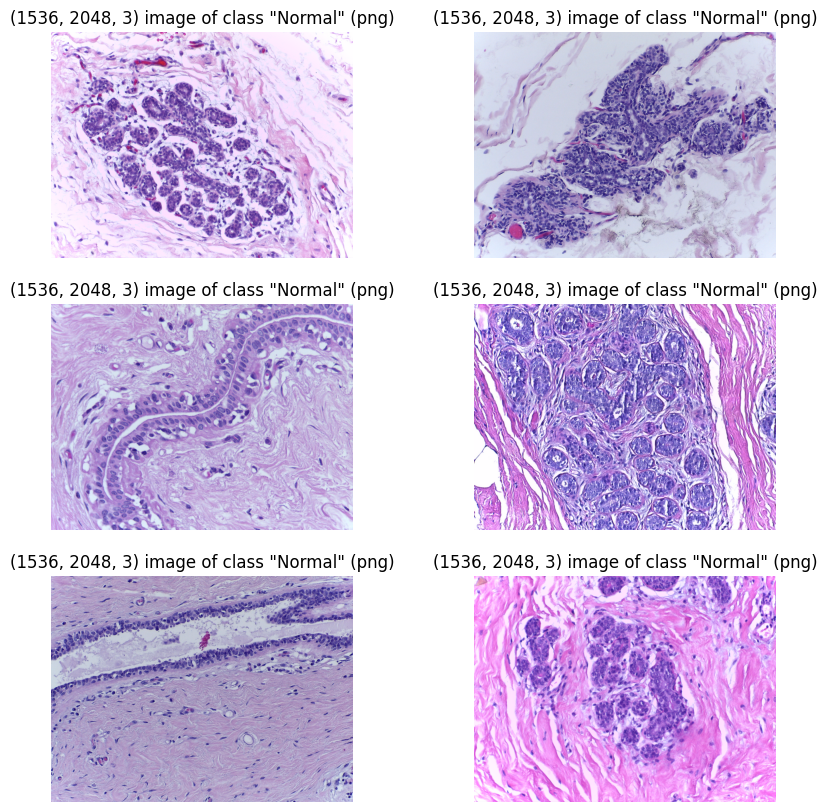

In [ ]:
def show_sample_images(folder_directory, class_):
    # Build a connection string
    full_path = folder_directory + class_ + "/"
    # Get a set of random images
    images = random.sample(os.listdir(full_path), 6)
    # Plot the images
    plt.figure(figsize=(10, 10))
    for i, img in enumerate(images):
        extension = img.split('.')[-1]
        img = mpimg.imread(full_path + img)
        ax = plt.subplot(3, 2,  i + 1)
        plt.imshow(img)
        plt.title("{} image of class \"{}\" ({})".format(img.shape, class_, extension))
        plt.axis("off")

show_sample_images(path + main_folder + training_folder, "Normal")

### Benign

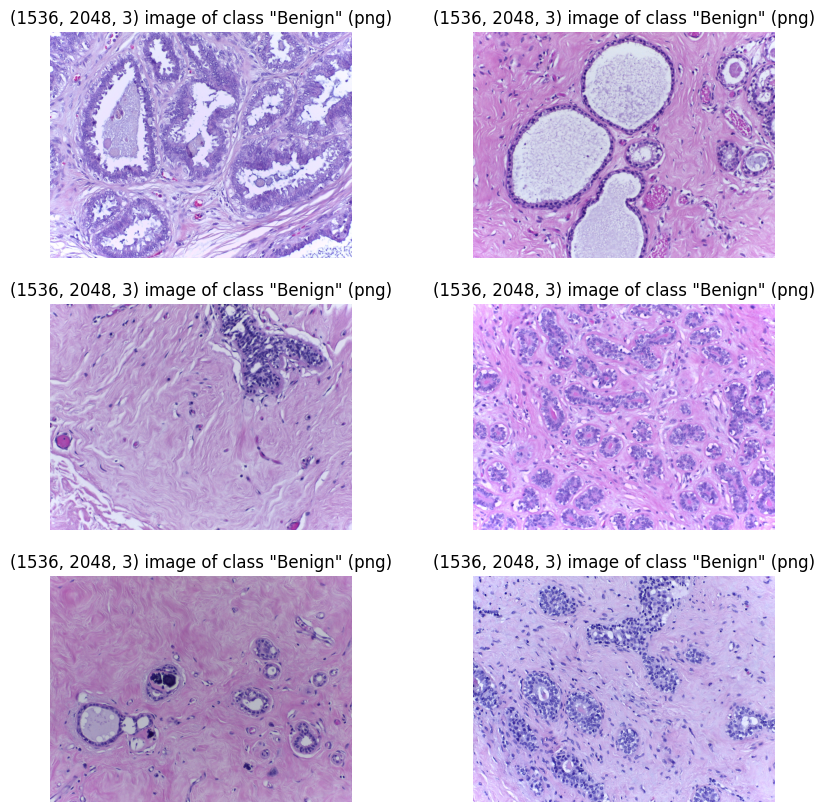

In [ ]:
def show_sample_images(folder_directory, class_):
    # Build a connection string
    full_path = folder_directory + class_ + "/"
    # Get a set of random images
    images = random.sample(os.listdir(full_path), 6)
    # Plot the images
    plt.figure(figsize=(10, 10))
    for i, img in enumerate(images):
        extension = img.split('.')[-1]
        img = mpimg.imread(full_path + img)
        ax = plt.subplot(3, 2,  i + 1)
        plt.imshow(img)
        plt.title("{} image of class \"{}\" ({})".format(img.shape, class_, extension))
        plt.axis("off")

show_sample_images(path + main_folder + training_folder, "Benign")

### InSitu

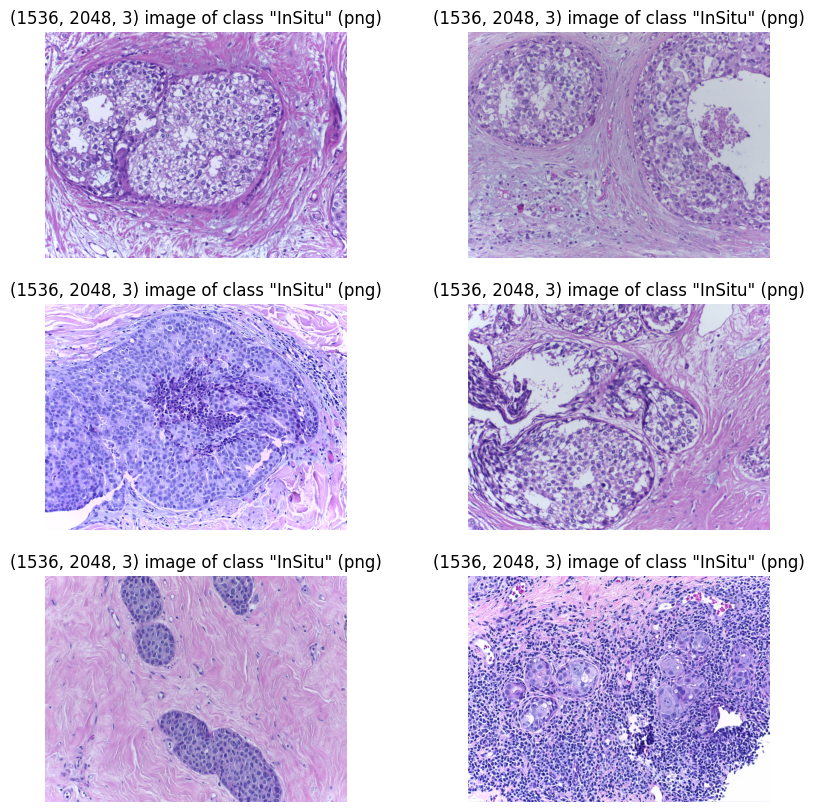

In [ ]:
def show_sample_images(folder_directory, class_):
    # Build a connection string
    full_path = folder_directory + class_ + "/"
    # Get a set of random images
    images = random.sample(os.listdir(full_path), 6)
    # Plot the images
    plt.figure(figsize=(10, 10))
    for i, img in enumerate(images):
        extension = img.split('.')[-1]
        img = mpimg.imread(full_path + img)
        ax = plt.subplot(3, 2,  i + 1)
        plt.imshow(img)
        plt.title("{} image of class \"{}\" ({})".format(img.shape, class_, extension))
        plt.axis("off")

show_sample_images(path + main_folder + training_folder, "InSitu")

### Invasive

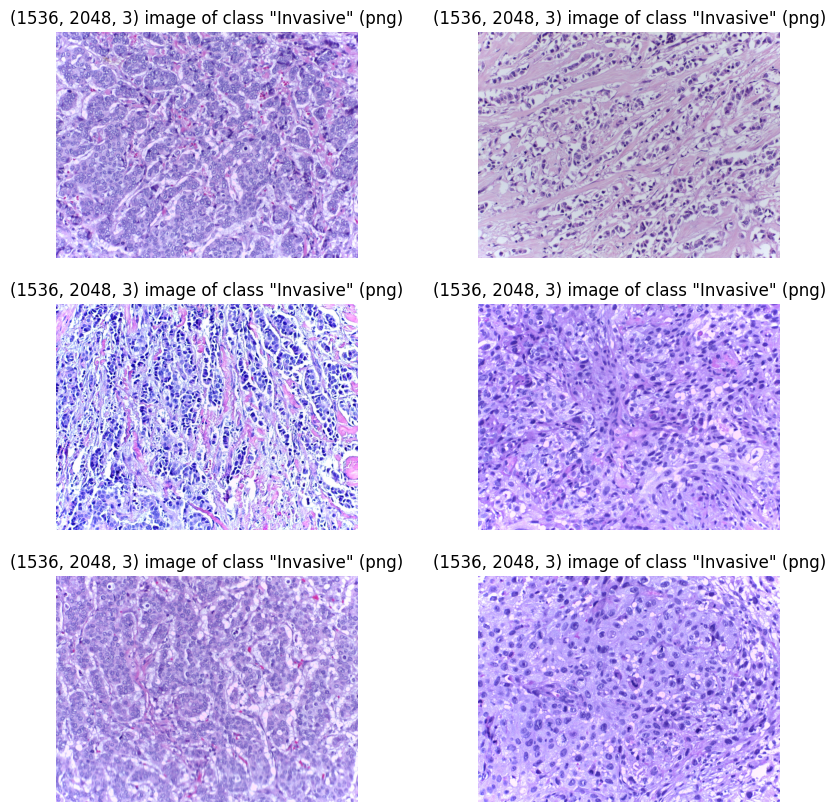

In [ ]:
def show_sample_images(folder_directory, class_):
    # Build a connection string
    full_path = folder_directory + class_ + "/"
    # Get a set of random images
    images = random.sample(os.listdir(full_path), 6)
    # Plot the images
    plt.figure(figsize=(10, 10))
    for i, img in enumerate(images):
        extension = img.split('.')[-1]
        img = mpimg.imread(full_path + img)
        ax = plt.subplot(3, 2,  i + 1)
        plt.imshow(img)
        plt.title("{} image of class \"{}\" ({})".format(img.shape, class_, extension))
        plt.axis("off")

show_sample_images(path + main_folder + training_folder, "Invasive")

### Inspecting classes' balance

In [ ]:
for split in [training_folder, testing_folder]:
    for c in ["Normal", "Benign", "InSitu", "Invasive"]:
        n_train_c = len(os.listdir(path + main_folder + split + f"/{c}"))
        print(f"Nº of instances of class {c} in the {split}: {n_train_c}")

Nº of instances of class Normal in the training_set/: 90
Nº of instances of class Benign in the training_set/: 90
Nº of instances of class InSitu in the training_set/: 90
Nº of instances of class Invasive in the training_set/: 90
Nº of instances of class Normal in the test_set/: 10
Nº of instances of class Benign in the test_set/: 10
Nº of instances of class InSitu in the test_set/: 10
Nº of instances of class Invasive in the test_set/: 10


### Other Explorations:

Converting images into a Numpy array to perform operations on them.
The following function will iterate through each class folder and turn them into an (n, m) matrix, where n is the number of observations and m is the number of pixels.

Source: https://gist.github.com/stereopickle/61d258aa46cab7b913fc17968523e070#file-pneumonia_npcovert-py

In [ ]:
# making n X m matrix
def img2np(path, list_of_filename, size = (256, 256, 3)):
    # iterating through each file
    for fn in list_of_filename:
        fp = path + fn
        current_image = image.load_img(fp, target_size = size, 
                                       color_mode = 'rgb')
        # covert image to a matrix
        img_ts = image.img_to_array(current_image)
        # turn that into a vector / 1D array
        img_ts = [img_ts.ravel()]
        try:
            # concatenate different images
            full_mat = np.concatenate((full_mat, img_ts))
        except UnboundLocalError: 
            # if not assigned yet, assign one
            full_mat = img_ts
    return full_mat

# run it on our folders

train_dir = path + main_folder + training_folder

# get the list of pngs from sub image class folders
normal_imgs = [fn for fn in os.listdir(f'{train_dir}/Normal') if fn.endswith('.png')]
benign_imgs = [fn for fn in os.listdir(f'{train_dir}/Benign') if fn.endswith('.png')]
insitu_imgs = [fn for fn in os.listdir(f'{train_dir}/InSitu') if fn.endswith('.png')]
invasive_imgs = [fn for fn in os.listdir(f'{train_dir}/Invasive') if fn.endswith('.png')]

normal_images = img2np(f'{train_dir}/Normal/', normal_imgs)
benign_images = img2np(f'{train_dir}/Benign/', benign_imgs)
insitu_images = img2np(f'{train_dir}/InSitu/', insitu_imgs)
invasive_images = img2np(f'{train_dir}/Invasive/', invasive_imgs)

#### Average Image

Seeing what the average image looks like for each class. 
To compute the average image, we take the average value of each pixel across all observations.

Source: https://gist.github.com/stereopickle/1bce78bcd925f89ef4e33070cfb7e43d#file-pneumonia_mean-py

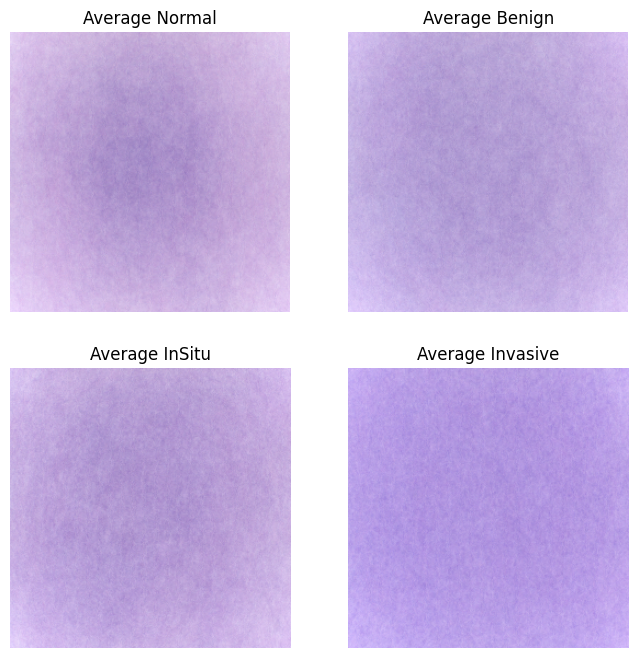

In [ ]:
def find_mean_img(full_mat, title, size = (256, 256, 3)):
    # calculate the average
    mean_img = np.mean(full_mat, axis = 0)
    # reshape it back to a matrix
    mean_img = mean_img.reshape(size)
    # normalize the image data
    mean_img /= np.max(mean_img)
    return mean_img

# calculate mean images for each class
norm_mean = find_mean_img(normal_images, 'Normal')
benign_mean = find_mean_img(benign_images, 'Benign')
insitu_mean = find_mean_img(insitu_images, 'InSitu')
invasive_mean = find_mean_img(invasive_images, 'Invasive')

# plot mean images using subplots
fig, axs = plt.subplots(2, 2, figsize=(8, 8))
axs[0, 0].imshow(norm_mean, vmin=0, vmax=1, cmap='viridis')
axs[0, 0].set_title('Average Normal')
axs[0, 1].imshow(benign_mean, vmin=0, vmax=1, cmap='viridis')
axs[0, 1].set_title('Average Benign')
axs[1, 0].imshow(insitu_mean, vmin=0, vmax=1, cmap='viridis')
axs[1, 0].set_title('Average InSitu')
axs[1, 1].imshow(invasive_mean, vmin=0, vmax=1, cmap='viridis')
axs[1, 1].set_title('Average Invasive')
for ax in axs.flat:
    ax.axis('off')
plt.show()

The resulting images show us that:
- Normal class images tend to have lower pixel values in the center of the image and higher pixel values in the suroundings.
- Benigns and InSitu classes images have a similar behavior, though the pixels in the center of the image seem to have higher values than the ones in Normal images and this "center" is also more spread out.
- Invasive class images seem to have almost the same pixel values all across the image.

#### Contrast Between Average Images

Source: https://gist.github.com/stereopickle/106dc02a7d72d237e8ad616dbf148d1e#file-pneumonia_contrast-py

Yellow represents lower values, while purple represents higher values. In the resulting images, yellow areas indicate a smaller difference between the normal and breast cancer tissues, while purple areas indicate a higher difference.

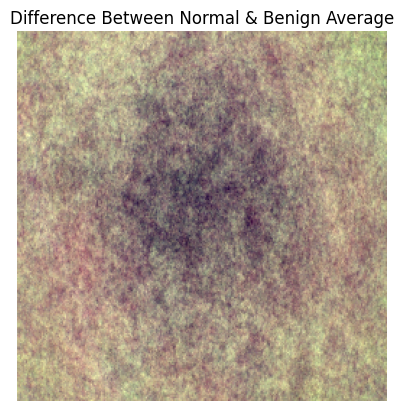

In [ ]:
contrast_mean = norm_mean - benign_mean
contrast_mean_scaled = (contrast_mean - contrast_mean.min()) / (contrast_mean.max() - contrast_mean.min())
plt.imshow(contrast_mean_scaled, cmap='viridis')
plt.title(f'Difference Between Normal & Benign Average')
plt.axis('off')
plt.show()

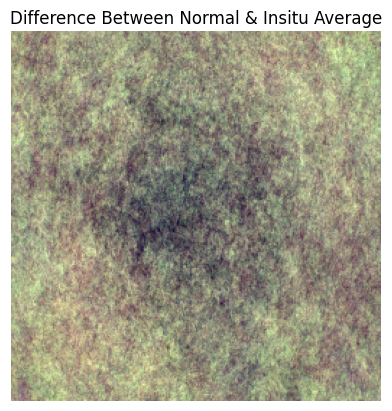

In [ ]:
contrast_mean = norm_mean - insitu_mean
contrast_mean_scaled = (contrast_mean - contrast_mean.min()) / (contrast_mean.max() - contrast_mean.min())
plt.imshow(contrast_mean_scaled, cmap='viridis')
plt.title(f'Difference Between Normal & Insitu Average')
plt.axis('off')
plt.show()

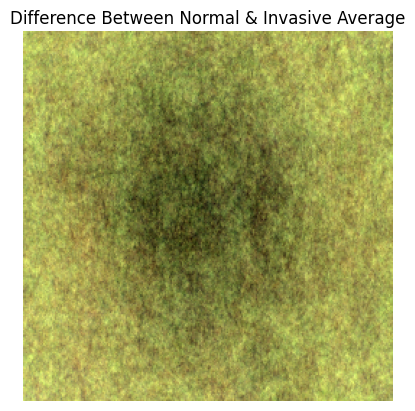

In [ ]:
contrast_mean = norm_mean - invasive_mean
contrast_mean_scaled = (contrast_mean - contrast_mean.min()) / (contrast_mean.max() - contrast_mean.min())
plt.imshow(contrast_mean_scaled, cmap='viridis')
plt.title(f'Difference Between Normal & Invasive Average')
plt.axis('off')
plt.show()

As we can see in the previous visualizations, regarding pixel values, the center of the dataset images have the biggest differences between normal class and breast cancer classes, this will probably be an important feature when making the classifications.

# **2. Data Preprocessing**

### **Generating tf.data.Datasets from image files in the directory.**

We will be loading batches of data using image_dataset_from_directory(). Some preprocessing steps will be performed while loading the data such as image resizing and one hot encoding of the labels through the label_mode parameter of the function.

The original size of the images in our dataset is 2048 x 1536 pixels, we are choosing 256 x 256 pixels as the new image size which we believe is small enough for the models to run but not so small that we loose so much information from the original images.

During this step, the batch size will also be defined. The batch size was selected based on the following recomendation: "...we recommend trying smaller batch sizes first(usually 32 or 64)..." taken from the following scientific article:

Ibrahem Kandel, Mauro Castelli,
The effect of batch size on the generalizability of the convolutional neural networks on a histopathology dataset,
ICT Express,
Volume 6, Issue 4,
2020,
Pages 312-315,
ISSN 2405-9595,
https://doi.org/10.1016/j.icte.2020.04.010.
(https://www.sciencedirect.com/science/article/pii/S2405959519303455) 

Defining a list of parameters for the image_dataset_from_directory.

In [134]:
image_size=(256, 256) 
crop_to_aspect_ratio=False # Since our images already have a fixed aspect ratio of 4:3, there is no need to crop them further.
color_mode='rgb'
batch_size=32 
label_mode="categorical"
validation_split=0.2
shuffle=True
seed=42

Loading the training data using the image_dataset_from_directory function. Performs an automatic split in training and validation data via validation_split.

In [135]:
# Generate an object of type tf.data.Dataset 
ds_train, ds_val = image_dataset_from_directory(path + main_folder + training_folder, 
                                                image_size=image_size,
                                                crop_to_aspect_ratio=crop_to_aspect_ratio,
                                                color_mode=color_mode,
                                                batch_size=batch_size,
                                                label_mode=label_mode,
                                                subset='both', 
                                                validation_split=validation_split, 
                                                shuffle=shuffle,
                                                seed=seed)
# Check object properties
print("\nObject's type:\t", type(ds_train))
print("Is it a tf.data.Dataset?\t R:",isinstance(ds_train, tf.data.Dataset))
print("Classes:", ds_train.class_names)

Found 360 files belonging to 4 classes.
Using 288 files for training.
Using 72 files for validation.

Object's type:	 <class 'tensorflow.python.data.ops.batch_op._BatchDataset'>
Is it a tf.data.Dataset?	 R: True
Classes: ['Benign', 'InSitu', 'Invasive', 'Normal']


Loading the testing data using the image_dataset_from_directory() function.

In [136]:
ds_test = image_dataset_from_directory(path + main_folder + testing_folder, 
                                       image_size=image_size,
                                       crop_to_aspect_ratio=crop_to_aspect_ratio,
                                       color_mode=color_mode,
                                       batch_size=batch_size,
                                       label_mode=label_mode,                                     
                                       shuffle=shuffle,
                                       seed=seed)

Found 40 files belonging to 4 classes.


Iterating over dataset's items, obtaining an iterator object from an instance of tf.data.Dataset

In [137]:
iter_train = iter(ds_train)
batch_x_train, batch_y_train = iter_train.next()
print(batch_x_train.shape, batch_y_train.shape)
print("\nSample of x_train:", batch_x_train[0, 0:2, 0:2, 0])
print("\nSample of y_train:", batch_y_train[0:5])
print("Sample average of y_train:", tf.reduce_mean(batch_y_train))

(32, 256, 256, 3) (32, 4)

Sample of x_train: tf.Tensor(
[[195.5  194.25]
 [201.75 193.5 ]], shape=(2, 2), dtype=float32)

Sample of y_train: tf.Tensor(
[[1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]], shape=(5, 4), dtype=float32)
Sample average of y_train: tf.Tensor(0.25, shape=(), dtype=float32)


Plotting images loaded with BatchDataset.

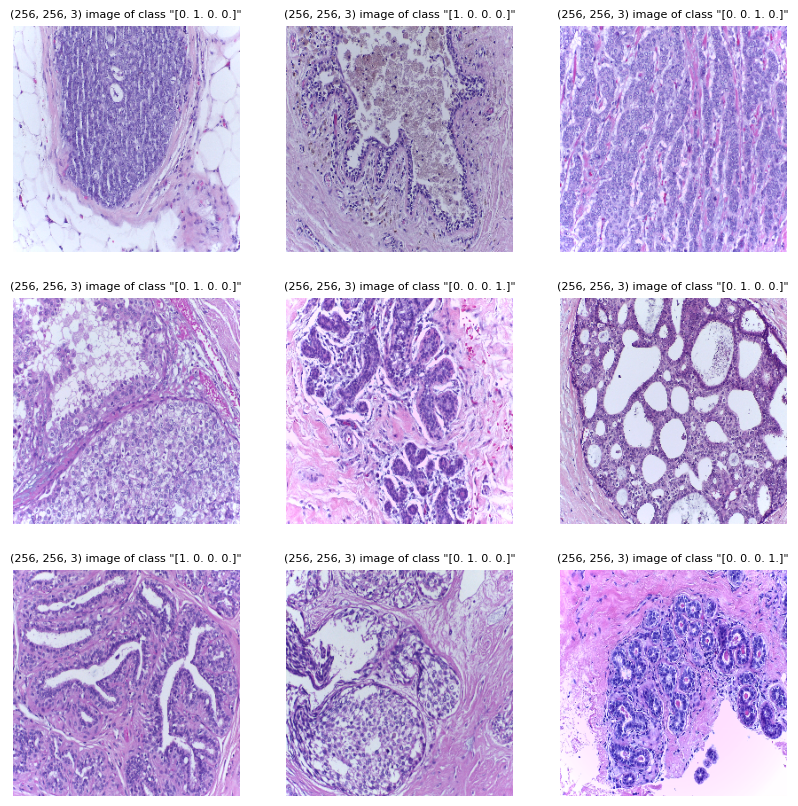

In [138]:
def show_sample_batch(ds, grid_size=(3, 3)):
    n_images = grid_size[0]*grid_size[1]
    # Get a batch via iteration
    iter_ = iter(ds)
    batch_x, batch_y = iter_.next()
    batch_x, batch_y = batch_x[0:n_images], batch_y[0:n_images]
    # Plot the images
    plt.figure(figsize=(10, 10))
    for i, (img, y) in enumerate(zip(batch_x, batch_y)):
        ax = plt.subplot(grid_size[0], grid_size[1],  i + 1)
        plt.imshow(tf.cast(img, tf.int32))
        plt.title("{} image of class \"{}\"".format(img.shape, y), size=8)
        plt.axis("off")

show_sample_batch(ds_train)

### **Pixel Normalization**

The pixel values in tensors representing images must be scaled before flowing them into a DL model during the training or evaluation of the model. The cell below creates a preprocessing pipeline using a Sequential container. The pipeline performs image scaling down to [0, 1]. Given the fact image resizing is already performed by the image_dataset_from_directory() function, no resizing and cropping are required.

In [139]:
preprocessing = Sequential([layers.Rescaling(1./255)], name="preprocessing")

This pipeline will be used when building the architecture of the models.

### **Data Augmentation**

"One of the largest challenges in histopathology image analysis is creating models that are robust to the variations across different labs and imaging systems. These variations can be caused by different color responses of slide scanners, raw materials, manufacturing techniques, and protocols for staining."

Source: https://towardsdatascience.com/5-ways-to-make-histopathology-image-models-more-robust-to-domain-shifts-323d4d21d889

Based on this information, our augmentation pipeline will include contrast an brightness transformations. Additionally, based on the visual analysis of the dataset, we consider flip and zoom in transformations to be appropiate as well.

Defining image augmentation pipeline.

In [140]:
augmentation = Sequential([
    layers.RandomFlip(),
    layers.RandomZoom(height_factor=(0.1, 0.2), width_factor=(0.1, 0.2)), 
    layers.RandomContrast(factor=0.2),
    layers.RandomBrightness(factor=0.2)
], name="my_augmentation_pipeline")

This pipeline will be used when building the architecture of the models.

Checking how many new images are being created with augmentation

In [141]:
# Generate a batch of images
batch_size = 32
ds_train_batch = ds_train.take(1)

# Apply the data augmentation pipeline to the batch
augmented_images = []
for image, label in ds_train_batch:
    for i in range(batch_size):
        # Apply image augmentation to each image in the batch
        augmented_image = augmentation(image)
        augmented_images.append(augmented_image)

# Calculate the number of augmented images per batch
num_augmented_images = len(augmented_images)
num_original_images = batch_size
total_images_per_batch = num_augmented_images + num_original_images

print(f"Batch size: {batch_size}")
print(f"Number of original images per batch: {num_original_images}")
print(f"Number of augmented images per batch: {num_augmented_images}")
print(f"Total number of images per batch: {total_images_per_batch}")


Batch size: 32
Number of original images per batch: 32
Number of augmented images per batch: 32
Total number of images per batch: 64


Plotting batch of augmeted images

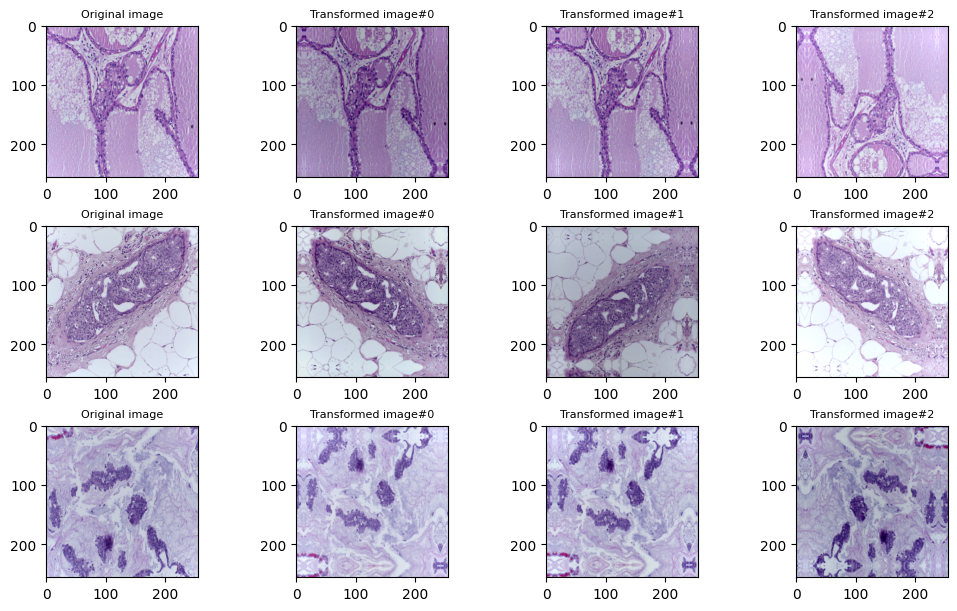

In [142]:
def show_augmented_sample_batch(batch_x, augmentation_pipe, trials=3, fig_size=(10, 6)):
    # Plot the images
    _, axs = plt.subplots(len(batch_x), trials + 1, figsize=(10, 6), layout='constrained')
    for i, img in enumerate(batch_x):
        axs[i, 0].imshow(tf.cast(img, tf.int32))
        axs[i, 0].set_title("Original image", size=8)
        for t in range(trials):
            # Pass through the augmentation pipeline
            augmented_i = augmentation_pipe(img, training=True)
            axs[i, t+1].imshow(tf.cast(augmented_i, tf.int32))
            axs[i, t+1].set_title("Transformed image#{}".format(t), size=8)

show_augmented_sample_batch(batch_x_train[0:3], augmentation_pipe=augmentation)

# **3. Handcrafted Model**

Creating a variable with the input shape to use in model arquitectures

In [143]:
input_shape = tuple(batch_x_train.shape)

Defining Callbacks for trainning

In [144]:
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor = 'val_loss', # we are monitoring the validation loss to decide when to stop the training
        mode = 'min', # we seek minimal loss
        patience = 10 # if the learning reaches a plateau, it will continue for 10 more epochs in case the plateau leads to improved performance
    )]

### **Baseline Model (Without Augmentation)**

Model Arquitecture and Compiling

In [ ]:
with tf.device(device_name):
  
  model_1 = tf.keras.Sequential()

  model_1.add(tf.keras.Input(shape=(256, 256, 3))) # Input layer
  model_1.add(preprocessing) # Pixel normalization
  model_1.add(tf.keras.layers.Conv2D(8*input_shape[-1], 3, strides=1, padding='same', activation='relu')) # 1 conv hidden layer
  model_1.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 1 pooling layer
  model_1.add(tf.keras.layers.Flatten())
  model_1.add(tf.keras.layers.Dense(10, activation='relu')) # 1 dense hidden layer
  model_1.add(tf.keras.layers.Dense(4, activation='softmax')) # Output layer

  model_1.summary()

  learning_rate = 0.001  
  model_1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
                  loss=tf.keras.losses.CategoricalCrossentropy(), 
                  metrics=[tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),tf.keras.metrics.AUC(name='AUROC')])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 preprocessing (Sequential)  (None, 256, 256, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 24)      672       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 24)     0         
 )                                                               
                                                                 
 flatten (Flatten)           (None, 393216)            0         
                                                                 
 dense (Dense)               (None, 10)                3932170   
                                                                 
 dense_1 (Dense)             (None, 4)                 44        
                                                        

Model Trainning

In [ ]:
# Model training (Fits the model on ds_train. Uses ds_val for validation.)
epochs = 100
history1 = model_1.fit(ds_train, epochs=epochs, validation_data=ds_val, callbacks=callbacks, verbose=1)

Epoch 1/100
9/9 [==============================] - 16s 169ms/step - loss: 7.3145 - categorical_accuracy: 0.2535 - AUROC: 0.4978 - val_loss: 1.3867 - val_categorical_accuracy: 0.2361 - val_AUROC: 0.5000
Epoch 2/100
9/9 [==============================] - 4s 114ms/step - loss: 1.3862 - categorical_accuracy: 0.2535 - AUROC: 0.5046 - val_loss: 1.3870 - val_categorical_accuracy: 0.2361 - val_AUROC: 0.4907
Epoch 3/100
9/9 [==============================] - 4s 104ms/step - loss: 1.3861 - categorical_accuracy: 0.2535 - AUROC: 0.5023 - val_loss: 1.3871 - val_categorical_accuracy: 0.2361 - val_AUROC: 0.4907
Epoch 4/100
9/9 [==============================] - 4s 104ms/step - loss: 1.3861 - categorical_accuracy: 0.2535 - AUROC: 0.5023 - val_loss: 1.3872 - val_categorical_accuracy: 0.2361 - val_AUROC: 0.4907
Epoch 5/100
9/9 [==============================] - 4s 102ms/step - loss: 1.3861 - categorical_accuracy: 0.2535 - AUROC: 0.5023 - val_loss: 1.3873 - val_categorical_accuracy: 0.2361 - val_AUROC: 0

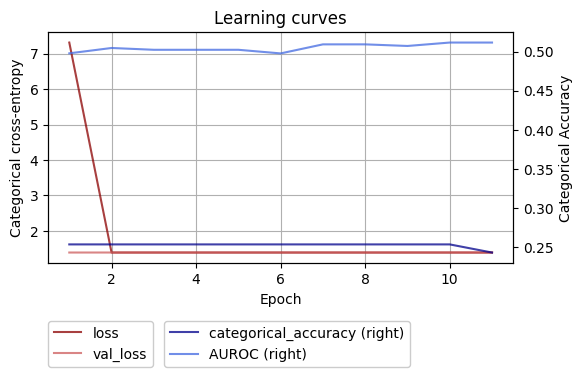

In [ ]:
# Plots the learning curves

# Create DataFrame object
df_hist = pd.DataFrame.from_dict(history1.history)
df_hist["Epoch"] = np.arange(1, len(df_hist) + 1, 1)
# Plot learning curves
secondary_y = ['categorical_accuracy', 'AUROC']  #  ["AUROC", "val_AUROC"] 
ax = df_hist.plot(x="Epoch", y=['loss', 'val_loss'] + secondary_y,
                  secondary_y = secondary_y,
                  kind="line", figsize=(6, 3), grid=True, legend=True,
                  ylabel="Categorical cross-entropy", 
                  xlabel="Epoch", title="Learning curves",                  
                  color=['darkred', 'indianred', "darkblue", "royalblue"], alpha=0.75, fontsize=10)
ax.right_ax.set_ylabel("Categorical Accuracy")
ax.right_ax.legend(loc=(0.25, -0.45), framealpha=1.0)
ax.legend(loc=(0, -0.45), framealpha=1.0)
plt.show()

Evaluating on Test Set

In [ ]:
test_loss, test_categorical_accuracy, test_AUROC = model_1.evaluate(ds_test)
print('Test Loss:', test_loss)
print('Test Categorical Accuracy:', test_categorical_accuracy) 
print('Test AUROC:', test_AUROC)

2/2 [==============================] - 0s 12ms/step - loss: 1.3864 - categorical_accuracy: 0.2500 - AUROC: 0.5000
Test Loss: 1.386352300643921
Test Categorical Accuracy: 0.25
Test AUROC: 0.5


### **Baseline Model (With Augmentation)**

Model Arquitecture and Compiling

In [ ]:
with tf.device(device_name):
  
  model_1B = tf.keras.Sequential()

  model_1B.add(tf.keras.Input(shape=(256, 256, 3))) # Input layer
  model_1B.add(preprocessing) # Pixel normalization
  model_1B.add(augmentation) # Image Augmentation
  model_1B.add(tf.keras.layers.Conv2D(8*input_shape[-1], 3, strides=1, padding='same', activation='relu')) # 1 conv hidden layer
  model_1B.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 1 pooling layer
  model_1B.add(tf.keras.layers.Flatten())
  model_1B.add(tf.keras.layers.Dense(10, activation='relu')) # 1 dense hidden layer
  model_1B.add(tf.keras.layers.Dense(4, activation='softmax')) # Output layer

  model_1B.summary()

  learning_rate = 0.001  
  model_1B.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
                  loss=tf.keras.losses.CategoricalCrossentropy(), 
                  metrics=[tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),tf.keras.metrics.AUC(name='AUROC')])

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 preprocessing (Sequential)  (None, 256, 256, 3)       0         
                                                                 
 my_augmentation_pipeline (S  (None, 256, 256, 3)      0         
 equential)                                                      
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 256, 24)      672       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 128, 128, 24)     0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 393216)            0         
                                                                 
 dense_2 (Dense)             (None, 10)               

Model Trainning

In [ ]:
# Model training (Fits the model on ds_train. Uses ds_val for validation.)
epochs = 100
history1B = model_1B.fit(ds_train, epochs=epochs, validation_data=ds_val, callbacks=callbacks, verbose=1)

Epoch 1/100
9/9 [==============================] - 6s 130ms/step - loss: 60.5804 - categorical_accuracy: 0.2361 - AUROC: 0.5178 - val_loss: 1.3859 - val_categorical_accuracy: 0.3056 - val_AUROC: 0.5000
Epoch 2/100
9/9 [==============================] - 4s 119ms/step - loss: 39.6792 - categorical_accuracy: 0.2118 - AUROC: 0.4736 - val_loss: 1.3857 - val_categorical_accuracy: 0.3056 - val_AUROC: 0.5370
Epoch 3/100
9/9 [==============================] - 4s 105ms/step - loss: 1.3865 - categorical_accuracy: 0.2257 - AUROC: 0.4838 - val_loss: 1.3858 - val_categorical_accuracy: 0.2361 - val_AUROC: 0.4907
Epoch 4/100
9/9 [==============================] - 4s 105ms/step - loss: 1.3865 - categorical_accuracy: 0.2535 - AUROC: 0.5023 - val_loss: 1.3858 - val_categorical_accuracy: 0.2361 - val_AUROC: 0.4907
Epoch 5/100
9/9 [==============================] - 4s 105ms/step - loss: 1.3864 - categorical_accuracy: 0.2535 - AUROC: 0.5023 - val_loss: 1.3859 - val_categorical_accuracy: 0.2361 - val_AUROC: 

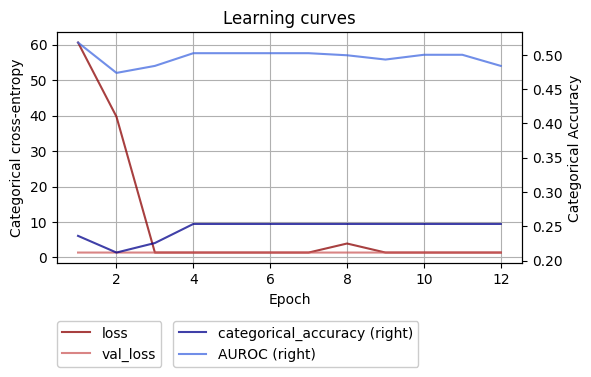

In [ ]:
# Plots the learning curves

# Create DataFrame object
df_hist = pd.DataFrame.from_dict(history1B.history)
df_hist["Epoch"] = np.arange(1, len(df_hist) + 1, 1)
# Plot learning curves
secondary_y = ['categorical_accuracy', 'AUROC']  #  ["AUROC", "val_AUROC"] 
ax = df_hist.plot(x="Epoch", y=['loss', 'val_loss'] + secondary_y,
                  secondary_y = secondary_y,
                  kind="line", figsize=(6, 3), grid=True, legend=True,
                  ylabel="Categorical cross-entropy", 
                  xlabel="Epoch", title="Learning curves",                  
                  color=['darkred', 'indianred', "darkblue", "royalblue"], alpha=0.75, fontsize=10)
ax.right_ax.set_ylabel("Categorical Accuracy")
ax.right_ax.legend(loc=(0.25, -0.45), framealpha=1.0)
ax.legend(loc=(0, -0.45), framealpha=1.0)
plt.show()

Evaluating on Test Set

In [ ]:
test_loss, test_categorical_accuracy, test_AUROC = model_1B.evaluate(ds_test)
print('Test Loss:', test_loss)
print('Test Categorical Accuracy:', test_categorical_accuracy) 
print('Test AUROC:', test_AUROC)

2/2 [==============================] - 1s 12ms/step - loss: 1.3863 - categorical_accuracy: 0.2500 - AUROC: 0.5000
Test Loss: 1.3863036632537842
Test Categorical Accuracy: 0.25
Test AUROC: 0.5


### **Model 2**

Model Arquitecture and Compiling

In [ ]:
with tf.device(device_name):
  
  model_2 = tf.keras.Sequential()

  model_2.add(tf.keras.Input(shape=(256, 256, 3))) # Input layer
  model_2.add(preprocessing) # Pixel normalization
  model_2.add(tf.keras.layers.Conv2D(32*input_shape[-1], 5, strides=2, padding='same', activation='relu')) # 1st conv hidden layer
  model_2.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 1st pooling layer
  model_2.add(tf.keras.layers.Conv2D(64*input_shape[-1], 5, strides=2, padding='same', activation='relu')) # 2nd conv hidden layer
  model_2.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 2nd pooling layer
  model_2.add(tf.keras.layers.Conv2D(128*input_shape[-1], 5, strides=2, padding='same', activation='relu')) # 3rd conv hidden layer
  model_2.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 3rd pooling layer
  model_2.add(tf.keras.layers.Flatten())
  model_2.add(tf.keras.layers.Dense(120, activation='relu')) # 1st dense hidden layer
  model_2.add(tf.keras.layers.Dense(84, activation='relu')) # 2nd dense hidden layer
  model_2.add(tf.keras.layers.Dense(4, activation='softmax')) # Output layer

  model_2.summary()

  learning_rate = 0.001  
  model_2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
                  loss=tf.keras.losses.CategoricalCrossentropy(), 
                  metrics=[tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),tf.keras.metrics.AUC(name='AUROC')])

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 preprocessing (Sequential)  (None, 256, 256, 3)       0         
                                                                 
 conv2d_26 (Conv2D)          (None, 128, 128, 96)      7296      
                                                                 
 max_pooling2d_24 (MaxPoolin  (None, 64, 64, 96)       0         
 g2D)                                                            
                                                                 
 conv2d_27 (Conv2D)          (None, 32, 32, 192)       460992    
                                                                 
 max_pooling2d_25 (MaxPoolin  (None, 16, 16, 192)      0         
 g2D)                                                            
                                                                 
 conv2d_28 (Conv2D)          (None, 8, 8, 384)       

Model Trainning

In [ ]:
# Model training (Fits the model on ds_train. Uses ds_val for validation.)
epochs = 100
history2 = model_2.fit(ds_train, epochs=epochs, validation_data=ds_val, callbacks=callbacks, verbose=1)

Epoch 1/100
9/9 [==============================] - 6s 135ms/step - loss: 1.5604 - categorical_accuracy: 0.1979 - AUROC: 0.4790 - val_loss: 1.3860 - val_categorical_accuracy: 0.2361 - val_AUROC: 0.4907
Epoch 2/100
9/9 [==============================] - 4s 108ms/step - loss: 1.3915 - categorical_accuracy: 0.2326 - AUROC: 0.4696 - val_loss: 1.3848 - val_categorical_accuracy: 0.3056 - val_AUROC: 0.5370
Epoch 3/100
9/9 [==============================] - 4s 117ms/step - loss: 1.3866 - categorical_accuracy: 0.2708 - AUROC: 0.4965 - val_loss: 1.3882 - val_categorical_accuracy: 0.2639 - val_AUROC: 0.4984
Epoch 4/100
9/9 [==============================] - 4s 109ms/step - loss: 1.3881 - categorical_accuracy: 0.2604 - AUROC: 0.5015 - val_loss: 1.3867 - val_categorical_accuracy: 0.2083 - val_AUROC: 0.4722
Epoch 5/100
9/9 [==============================] - 4s 108ms/step - loss: 1.3860 - categorical_accuracy: 0.2604 - AUROC: 0.5104 - val_loss: 1.3872 - val_categorical_accuracy: 0.2083 - val_AUROC: 0.

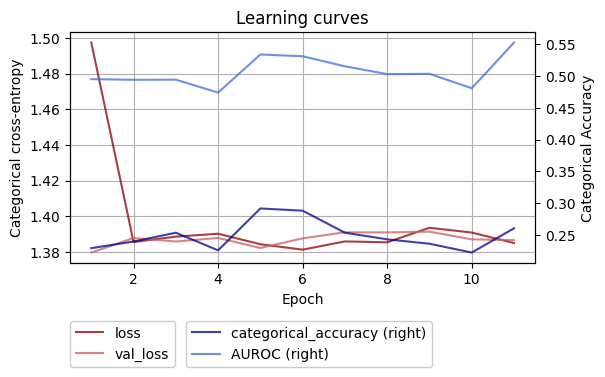

In [ ]:
# Plots the learning curves

# Create DataFrame object
df_hist = pd.DataFrame.from_dict(history2.history)
df_hist["Epoch"] = np.arange(1, len(df_hist) + 1, 1)
# Plot learning curves
secondary_y = ['categorical_accuracy', 'AUROC']  #  ["AUROC", "val_AUROC"] 
ax = df_hist.plot(x="Epoch", y=['loss', 'val_loss'] + secondary_y,
                  secondary_y = secondary_y,
                  kind="line", figsize=(6, 3), grid=True, legend=True,
                  ylabel="Categorical cross-entropy", 
                  xlabel="Epoch", title="Learning curves",                  
                  color=['darkred', 'indianred', "darkblue", "royalblue"], alpha=0.75, fontsize=10)
ax.right_ax.set_ylabel("Categorical Accuracy")
ax.right_ax.legend(loc=(0.25, -0.45), framealpha=1.0)
ax.legend(loc=(0, -0.45), framealpha=1.0)
plt.show()

Evaluating on Test Set

In [ ]:
test_loss, test_categorical_accuracy, test_AUROC = model_2.evaluate(ds_test)
print('Test Loss:', test_loss)
print('Test Categorical Accuracy:', test_categorical_accuracy) 
print('Test AUROC:', test_AUROC)

2/2 [==============================] - 1s 12ms/step - loss: 1.4258 - categorical_accuracy: 0.4250 - AUROC: 0.7049
Test Loss: 1.4258434772491455
Test Categorical Accuracy: 0.42500001192092896
Test AUROC: 0.7048957943916321


## **Model 3A**

Model Arquitecture and Compiling

In [ ]:
with tf.device(device_name):
  
  model_3A = tf.keras.Sequential()

  model_3A.add(tf.keras.Input(shape=(256, 256, 3))) # Input layer
  model_3A.add(preprocessing) # Pixel normalization
  model_3A.add(tf.keras.layers.Conv2D(32*input_shape[-1], 5, strides=2, padding='same', activation='relu')) # 1st conv hidden layer
  model_3A.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 1st pooling layer
  model_3A.add(tf.keras.layers.Conv2D(64*input_shape[-1], 5, strides=2, padding='same', activation='relu')) # 2nd conv hidden layer
  model_3A.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 2nd pooling layer
  model_3A.add(tf.keras.layers.Conv2D(128*input_shape[-1], 5, strides=2, padding='same', activation='relu')) # 3rd conv hidden layer
  model_3A.add(tf.keras.layers.Conv2D(128*input_shape[-1], 5, strides=2, padding='same', activation='relu')) # 4th conv hidden layer
  model_3A.add(tf.keras.layers.Conv2D(128*input_shape[-1], 5, strides=2, padding='same', activation='relu')) # 5th conv hidden layer
  model_3A.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 3rd pooling layer
  model_3A.add(tf.keras.layers.Flatten())
  model_3A.add(tf.keras.layers.Dense(120, activation='relu')) # 1st dense hidden layer
  model_3A.add(tf.keras.layers.Dense(84, activation='relu')) # 2nd dense hidden layer
  model_3A.add(tf.keras.layers.Dense(4, activation='softmax')) # Output layer

  model_3A.summary()

  learning_rate = 0.001  
  model_3A.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
                  loss=tf.keras.losses.CategoricalCrossentropy(), 
                  metrics=[tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),tf.keras.metrics.AUC(name='AUROC')])

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 preprocessing (Sequential)  (None, 256, 256, 3)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 96)      7296      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 64, 64, 96)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 192)       460992    
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 16, 16, 192)      0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 8, 8, 384)        

Model Trainning

In [ ]:
# Model training (Fits the model on ds_train. Uses ds_val for validation.)
epochs = 100
history3A = model_3A.fit(ds_train, epochs=epochs, validation_data=ds_val, callbacks=callbacks, verbose=1)

Epoch 1/100
9/9 [==============================] - 7s 146ms/step - loss: 1.5562 - categorical_accuracy: 0.2396 - AUROC: 0.4804 - val_loss: 1.3957 - val_categorical_accuracy: 0.2083 - val_AUROC: 0.4685
Epoch 2/100
9/9 [==============================] - 4s 109ms/step - loss: 1.3880 - categorical_accuracy: 0.2604 - AUROC: 0.5138 - val_loss: 1.3887 - val_categorical_accuracy: 0.2361 - val_AUROC: 0.4537
Epoch 3/100
9/9 [==============================] - 4s 120ms/step - loss: 1.3859 - categorical_accuracy: 0.2500 - AUROC: 0.5162 - val_loss: 1.3882 - val_categorical_accuracy: 0.2500 - val_AUROC: 0.4745
Epoch 4/100
9/9 [==============================] - 4s 109ms/step - loss: 1.3959 - categorical_accuracy: 0.2326 - AUROC: 0.4921 - val_loss: 1.3892 - val_categorical_accuracy: 0.2083 - val_AUROC: 0.4662
Epoch 5/100
9/9 [==============================] - 4s 109ms/step - loss: 1.3860 - categorical_accuracy: 0.2326 - AUROC: 0.5120 - val_loss: 1.3877 - val_categorical_accuracy: 0.2361 - val_AUROC: 0.

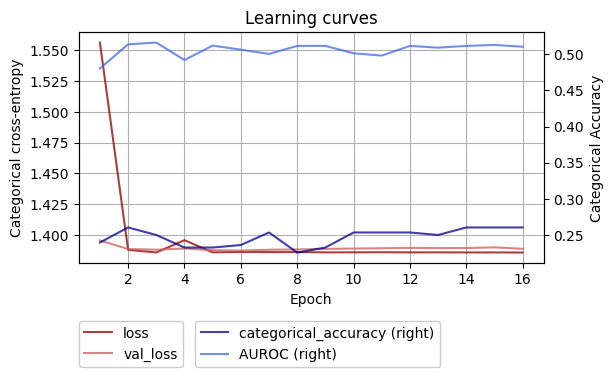

In [ ]:
# Plots the learning curves

# Create DataFrame object
df_hist = pd.DataFrame.from_dict(history3A.history)
df_hist["Epoch"] = np.arange(1, len(df_hist) + 1, 1)
# Plot learning curves
secondary_y = ['categorical_accuracy', 'AUROC']  #  ["AUROC", "val_AUROC"] 
ax = df_hist.plot(x="Epoch", y=['loss', 'val_loss'] + secondary_y,
                  secondary_y = secondary_y,
                  kind="line", figsize=(6, 3), grid=True, legend=True,
                  ylabel="Categorical cross-entropy", 
                  xlabel="Epoch", title="Learning curves",                  
                  color=['darkred', 'indianred', "darkblue", "royalblue"], alpha=0.75, fontsize=10)
ax.right_ax.set_ylabel("Categorical Accuracy")
ax.right_ax.legend(loc=(0.25, -0.45), framealpha=1.0)
ax.legend(loc=(0, -0.45), framealpha=1.0)
plt.show()

Evaluating on Test Set

In [ ]:
test_loss, test_categorical_accuracy, test_AUROC = model_3A.evaluate(ds_test)
print('Test Loss:', test_loss)
print('Test Categorical Accuracy:', test_categorical_accuracy) 
print('Test AUROC:', test_AUROC)

2/2 [==============================] - 1s 121ms/step - loss: 1.3868 - categorical_accuracy: 0.2750 - AUROC: 0.4985
Test Loss: 1.3868186473846436
Test Categorical Accuracy: 0.2750000059604645
Test AUROC: 0.4985416829586029


## **Model 3B**

Model Arquitecture and Compiling

In [ ]:
with tf.device(device_name):
  
  model_3B = tf.keras.Sequential()

  model_3B.add(tf.keras.Input(shape=(256, 256, 3))) # Input layer
  model_3B.add(preprocessing) # Pixel normalization
  model_3B.add(tf.keras.layers.Conv2D(64*input_shape[-1], 5, strides=2, padding='same', activation='relu')) # 1st conv hidden layer
  model_3B.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 1st pooling layer
  model_3B.add(tf.keras.layers.Conv2D(128*input_shape[-1], 5, strides=2, padding='same', activation='relu')) # 2nd conv hidden layer
  model_3B.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 2nd pooling layer
  model_3B.add(tf.keras.layers.Conv2D(256*input_shape[-1], 5, strides=2, padding='same', activation='relu')) # 3rd conv hidden layer
  model_3B.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 3rd pooling layer
  model_3B.add(tf.keras.layers.Flatten())
  model_3B.add(tf.keras.layers.Dense(120, activation='relu')) # 1st dense hidden layer
  model_3B.add(tf.keras.layers.Dense(84, activation='relu')) # 2nd dense hidden layer
  model_3B.add(tf.keras.layers.Dense(4, activation='softmax')) # Output layer

  model_3B.summary()

  learning_rate = 0.001  
  model_3B.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
                  loss=tf.keras.losses.CategoricalCrossentropy(), 
                  metrics=[tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),tf.keras.metrics.AUC(name='AUROC')])

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 preprocessing (Sequential)  (None, 256, 256, 3)       0         
                                                                 
 conv2d_29 (Conv2D)          (None, 128, 128, 192)     14592     
                                                                 
 max_pooling2d_27 (MaxPoolin  (None, 64, 64, 192)      0         
 g2D)                                                            
                                                                 
 conv2d_30 (Conv2D)          (None, 32, 32, 384)       1843584   
                                                                 
 max_pooling2d_28 (MaxPoolin  (None, 16, 16, 384)      0         
 g2D)                                                            
                                                                 
 conv2d_31 (Conv2D)          (None, 8, 8, 768)       

Model Trainning

In [ ]:
# Model training (Fits the model on ds_train. Uses ds_val for validation.)
epochs = 100
history3B = model_3B.fit(ds_train, epochs=epochs, validation_data=ds_val, callbacks=callbacks, verbose=1)

Epoch 1/100
9/9 [==============================] - 6s 145ms/step - loss: 1.9010 - categorical_accuracy: 0.2361 - AUROC: 0.4814 - val_loss: 1.3891 - val_categorical_accuracy: 0.2083 - val_AUROC: 0.4480
Epoch 2/100
9/9 [==============================] - 4s 131ms/step - loss: 1.3942 - categorical_accuracy: 0.2569 - AUROC: 0.5072 - val_loss: 1.3895 - val_categorical_accuracy: 0.2361 - val_AUROC: 0.4571
Epoch 3/100
9/9 [==============================] - 4s 116ms/step - loss: 1.3867 - categorical_accuracy: 0.2535 - AUROC: 0.5006 - val_loss: 1.3838 - val_categorical_accuracy: 0.2639 - val_AUROC: 0.5488
Epoch 4/100
9/9 [==============================] - 4s 116ms/step - loss: 1.3882 - categorical_accuracy: 0.2743 - AUROC: 0.5308 - val_loss: 1.3839 - val_categorical_accuracy: 0.3611 - val_AUROC: 0.5551
Epoch 5/100
9/9 [==============================] - 4s 117ms/step - loss: 1.3897 - categorical_accuracy: 0.2743 - AUROC: 0.5111 - val_loss: 1.3872 - val_categorical_accuracy: 0.2361 - val_AUROC: 0.

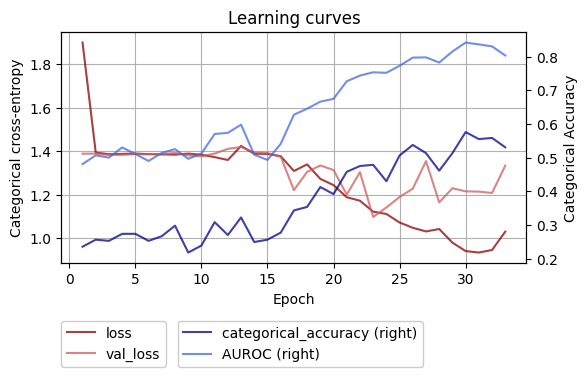

In [ ]:
# Plots the learning curves

# Create DataFrame object
df_hist = pd.DataFrame.from_dict(history3B.history)
df_hist["Epoch"] = np.arange(1, len(df_hist) + 1, 1)
# Plot learning curves
secondary_y = ['categorical_accuracy', 'AUROC']  #  ["AUROC", "val_AUROC"] 
ax = df_hist.plot(x="Epoch", y=['loss', 'val_loss'] + secondary_y,
                  secondary_y = secondary_y,
                  kind="line", figsize=(6, 3), grid=True, legend=True,
                  ylabel="Categorical cross-entropy", 
                  xlabel="Epoch", title="Learning curves",                  
                  color=['darkred', 'indianred', "darkblue", "royalblue"], alpha=0.75, fontsize=10)
ax.right_ax.set_ylabel("Categorical Accuracy")
ax.right_ax.legend(loc=(0.25, -0.45), framealpha=1.0)
ax.legend(loc=(0, -0.45), framealpha=1.0)
plt.show()

Evaluating on Test Set

In [ ]:
test_loss, test_categorical_accuracy, test_AUROC = model_3B.evaluate(ds_test)
print('Test Loss:', test_loss)
print('Test Categorical Accuracy:', test_categorical_accuracy) 
print('Test AUROC:', test_AUROC)

2/2 [==============================] - 1s 14ms/step - loss: 1.4675 - categorical_accuracy: 0.4750 - AUROC: 0.6656
Test Loss: 1.467472791671753
Test Categorical Accuracy: 0.4749999940395355
Test AUROC: 0.6656250357627869


## **Model 3C**

Model Arquitecture and Compiling

In [ ]:
with tf.device(device_name):
  
  model_3C = tf.keras.Sequential()

  model_3C.add(tf.keras.Input(shape=(256, 256, 3))) # Input layer
  model_3C.add(preprocessing) # Pixel normalization
  model_3C.add(tf.keras.layers.Conv2D(32*input_shape[-1], 5, strides=2, padding='same', activation='relu')) # 1st conv hidden layer
  model_3C.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 1st pooling layer
  model_3C.add(tf.keras.layers.Conv2D(64*input_shape[-1], 5, strides=2, padding='same', activation='relu')) # 2nd conv hidden layer
  model_3C.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 2nd pooling layer
  model_3C.add(tf.keras.layers.Conv2D(128*input_shape[-1], 5, strides=2, padding='same', activation='relu')) # 3rd conv hidden layer
  model_3C.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 3rd pooling layer
  model_3C.add(tf.keras.layers.Flatten())
  model_3C.add(tf.keras.layers.Dense(120, activation='relu')) # 1st dense hidden layer
  model_3C.add(tf.keras.layers.Dense(84, activation='relu')) # 2nd dense hidden layer
  model_3C.add(tf.keras.layers.Dense(4, activation='softmax')) # Output layer

  model_3C.summary()

  learning_rate = 0.0001  
  model_3C.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
                  loss=tf.keras.losses.CategoricalCrossentropy(), 
                  metrics=[tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),tf.keras.metrics.AUC(name='AUROC')])

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 preprocessing (Sequential)  (None, 256, 256, 3)       0         
                                                                 
 conv2d_13 (Conv2D)          (None, 128, 128, 96)      7296      
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 64, 64, 96)       0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 32, 32, 192)       460992    
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 16, 16, 192)      0         
 g2D)                                                            
                                                                 
 conv2d_15 (Conv2D)          (None, 8, 8, 384)        

Model Trainning

In [ ]:
# Model training (Fits the model on ds_train. Uses ds_val for validation.)
epochs = 100
history3C = model_3C.fit(ds_train, epochs=epochs, validation_data=ds_val, callbacks=callbacks, verbose=1)

Epoch 1/100
9/9 [==============================] - 6s 137ms/step - loss: 1.3992 - categorical_accuracy: 0.2153 - AUROC: 0.4745 - val_loss: 1.3930 - val_categorical_accuracy: 0.2083 - val_AUROC: 0.4633
Epoch 2/100
9/9 [==============================] - 4s 120ms/step - loss: 1.3896 - categorical_accuracy: 0.2222 - AUROC: 0.4972 - val_loss: 1.3872 - val_categorical_accuracy: 0.2083 - val_AUROC: 0.4834
Epoch 3/100
9/9 [==============================] - 4s 107ms/step - loss: 1.3871 - categorical_accuracy: 0.2326 - AUROC: 0.4999 - val_loss: 1.3844 - val_categorical_accuracy: 0.2222 - val_AUROC: 0.5176
Epoch 4/100
9/9 [==============================] - 4s 107ms/step - loss: 1.3792 - categorical_accuracy: 0.2535 - AUROC: 0.5715 - val_loss: 1.3811 - val_categorical_accuracy: 0.2083 - val_AUROC: 0.5879
Epoch 5/100
9/9 [==============================] - 4s 107ms/step - loss: 1.3655 - categorical_accuracy: 0.2847 - AUROC: 0.6511 - val_loss: 1.3605 - val_categorical_accuracy: 0.3056 - val_AUROC: 0.

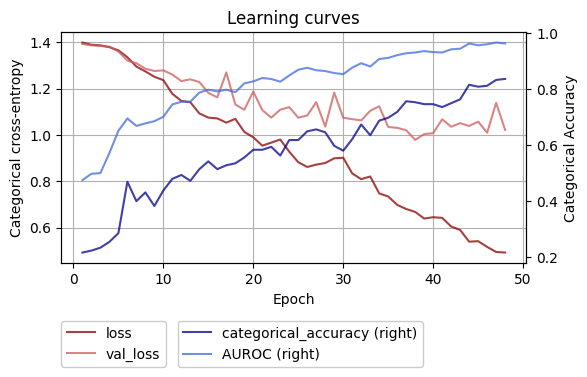

In [ ]:
# Plots the learning curves

# Create DataFrame object
df_hist = pd.DataFrame.from_dict(history3C.history)
df_hist["Epoch"] = np.arange(1, len(df_hist) + 1, 1)
# Plot learning curves
secondary_y = ['categorical_accuracy', 'AUROC']  #  ["AUROC", "val_AUROC"] 
ax = df_hist.plot(x="Epoch", y=['loss', 'val_loss'] + secondary_y,
                  secondary_y = secondary_y,
                  kind="line", figsize=(6, 3), grid=True, legend=True,
                  ylabel="Categorical cross-entropy", 
                  xlabel="Epoch", title="Learning curves",                  
                  color=['darkred', 'indianred', "darkblue", "royalblue"], alpha=0.75, fontsize=10)
ax.right_ax.set_ylabel("Categorical Accuracy")
ax.right_ax.legend(loc=(0.25, -0.45), framealpha=1.0)
ax.legend(loc=(0, -0.45), framealpha=1.0)
plt.show()

Evaluating on Test Set

In [ ]:
test_loss, test_categorical_accuracy, test_AUROC = model_3C.evaluate(ds_test)
print('Test Loss:', test_loss)
print('Test Categorical Accuracy:', test_categorical_accuracy) 
print('Test AUROC:', test_AUROC)

2/2 [==============================] - 0s 13ms/step - loss: 1.3738 - categorical_accuracy: 0.4750 - AUROC: 0.7815
Test Loss: 1.373751163482666
Test Categorical Accuracy: 0.4749999940395355
Test AUROC: 0.7814583778381348


## **Model 4A**

Model Arquitecture and Compiling

In [ ]:
with tf.device(device_name):
  
  model_4A = tf.keras.Sequential()

  model_4A.add(tf.keras.Input(shape=(256, 256, 3))) # Input layer
  model_4A.add(preprocessing) # Pixel normalization
  model_4A.add(tf.keras.layers.Conv2D(32*input_shape[-1], 5, strides=2, padding='same', activation='relu')) # 1st conv hidden layer
  model_4A.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 1st pooling layer
  model_4A.add(tf.keras.layers.Conv2D(64*input_shape[-1], 5, strides=2, padding='same', activation='relu')) # 2nd conv hidden layer
  model_4A.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 2nd pooling layer
  model_4A.add(tf.keras.layers.Conv2D(128*input_shape[-1], 5, strides=2, padding='same', activation='relu')) # 3rd conv hidden layer
  model_4A.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 3rd pooling layer
  model_4A.add(tf.keras.layers.Flatten())
  model_4A.add(tf.keras.layers.Dense(120, activation='relu')) # 1st dense hidden layer
  model_4A.add(tf.keras.layers.Dense(84, activation='relu')) # 2nd dense hidden layer
  model_4A.add(tf.keras.layers.Dropout(0.2)) # Dropout layer 
  model_4A.add(tf.keras.layers.Dense(4, activation='softmax')) # Output layer

  model_4A.summary()

  learning_rate = 0.0001  
  model_4A.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
                  loss=tf.keras.losses.CategoricalCrossentropy(), 
                  metrics=[tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),tf.keras.metrics.AUC(name='AUROC')])

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 preprocessing (Sequential)  (None, 256, 256, 3)       0         
                                                                 
 conv2d_16 (Conv2D)          (None, 128, 128, 96)      7296      
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 64, 64, 96)       0         
 g2D)                                                            
                                                                 
 conv2d_17 (Conv2D)          (None, 32, 32, 192)       460992    
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 16, 16, 192)      0         
 g2D)                                                            
                                                                 
 conv2d_18 (Conv2D)          (None, 8, 8, 384)        

Model Trainning

In [ ]:
# Model training (Fits the model on ds_train. Uses ds_val for validation.)
epochs = 100
history4A = model_4A.fit(ds_train, epochs=epochs, validation_data=ds_val, callbacks=callbacks, verbose=1)

Epoch 1/100
9/9 [==============================] - 6s 136ms/step - loss: 1.4030 - categorical_accuracy: 0.2326 - AUROC: 0.4439 - val_loss: 1.3871 - val_categorical_accuracy: 0.2083 - val_AUROC: 0.4951
Epoch 2/100
9/9 [==============================] - 4s 108ms/step - loss: 1.3903 - categorical_accuracy: 0.2639 - AUROC: 0.5001 - val_loss: 1.3859 - val_categorical_accuracy: 0.2917 - val_AUROC: 0.5208
Epoch 3/100
9/9 [==============================] - 4s 117ms/step - loss: 1.3829 - categorical_accuracy: 0.2882 - AUROC: 0.5353 - val_loss: 1.3859 - val_categorical_accuracy: 0.2639 - val_AUROC: 0.5072
Epoch 4/100
9/9 [==============================] - 4s 107ms/step - loss: 1.3773 - categorical_accuracy: 0.3021 - AUROC: 0.5696 - val_loss: 1.3860 - val_categorical_accuracy: 0.2083 - val_AUROC: 0.5107
Epoch 5/100
9/9 [==============================] - 4s 109ms/step - loss: 1.3821 - categorical_accuracy: 0.2465 - AUROC: 0.5382 - val_loss: 1.3744 - val_categorical_accuracy: 0.2361 - val_AUROC: 0.

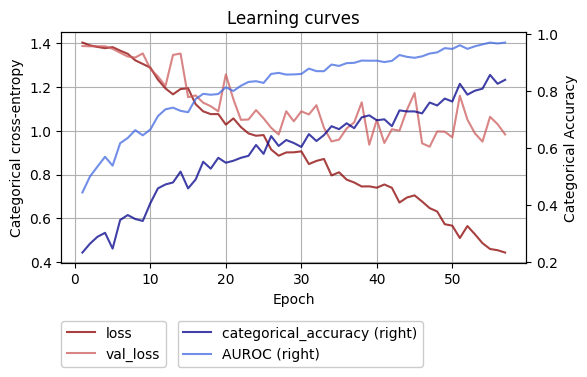

In [ ]:
# Plots the learning curves

# Create DataFrame object
df_hist = pd.DataFrame.from_dict(history4A.history)
df_hist["Epoch"] = np.arange(1, len(df_hist) + 1, 1)
# Plot learning curves
secondary_y = ['categorical_accuracy', 'AUROC']  #  ["AUROC", "val_AUROC"] 
ax = df_hist.plot(x="Epoch", y=['loss', 'val_loss'] + secondary_y,
                  secondary_y = secondary_y,
                  kind="line", figsize=(6, 3), grid=True, legend=True,
                  ylabel="Categorical cross-entropy", 
                  xlabel="Epoch", title="Learning curves",                  
                  color=['darkred', 'indianred', "darkblue", "royalblue"], alpha=0.75, fontsize=10)
ax.right_ax.set_ylabel("Categorical Accuracy")
ax.right_ax.legend(loc=(0.25, -0.45), framealpha=1.0)
ax.legend(loc=(0, -0.45), framealpha=1.0)
plt.show()

Evaluating on Test Set

In [ ]:
test_loss, test_categorical_accuracy, test_AUROC = model_4A.evaluate(ds_test)
print('Test Loss:', test_loss)
print('Test Categorical Accuracy:', test_categorical_accuracy) 
print('Test AUROC:', test_AUROC)

2/2 [==============================] - 1s 13ms/step - loss: 1.4877 - categorical_accuracy: 0.5500 - AUROC: 0.7655
Test Loss: 1.487668514251709
Test Categorical Accuracy: 0.550000011920929
Test AUROC: 0.7655208110809326


## **Model 4B**

Model Arquitecture and Compiling

In [ ]:
with tf.device(device_name):
  
  model_4B = tf.keras.Sequential()

  model_4B.add(tf.keras.Input(shape=(256, 256, 3))) # Input layer
  model_4B.add(preprocessing) # Pixel normalization
  model_4B.add(tf.keras.layers.Conv2D(32*input_shape[-1], 5, strides=2, padding='same', activation='relu')) # 1st conv hidden layer
  model_4B.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 1st pooling layer
  model_4B.add(tf.keras.layers.Conv2D(64*input_shape[-1], 5, strides=2, padding='same', activation='relu')) # 2nd conv hidden layer
  model_4B.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 2nd pooling layer
  model_4B.add(tf.keras.layers.Conv2D(128*input_shape[-1], 5, strides=2, padding='same', activation='relu')) # 3rd conv hidden layer
  model_4B.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 3rd pooling layer
  model_4B.add(tf.keras.layers.Flatten())
  model_4B.add(tf.keras.layers.Dense(120, activation='relu')) # 1st dense hidden layer
  model_4B.add(tf.keras.layers.Dropout(0.2)) # Dropout layer 
  model_4B.add(tf.keras.layers.Dense(84, activation='relu')) # 2nd dense hidden layer
  model_4B.add(tf.keras.layers.Dropout(0.2)) # Dropout layer 
  model_4B.add(tf.keras.layers.Dense(4, activation='softmax')) # Output layer

  model_4B.summary()

  learning_rate = 0.0001  
  model_4B.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
                  loss=tf.keras.losses.CategoricalCrossentropy(), 
                  metrics=[tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),tf.keras.metrics.AUC(name='AUROC')])

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 preprocessing (Sequential)  (None, 256, 256, 3)       0         
                                                                 
 conv2d_19 (Conv2D)          (None, 128, 128, 96)      7296      
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, 64, 64, 96)       0         
 g2D)                                                            
                                                                 
 conv2d_20 (Conv2D)          (None, 32, 32, 192)       460992    
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 16, 16, 192)      0         
 g2D)                                                            
                                                                 
 conv2d_21 (Conv2D)          (None, 8, 8, 384)        

Model Trainning

In [ ]:
# Model training (Fits the model on ds_train. Uses ds_val for validation.)
epochs = 100
history4B = model_4B.fit(ds_train, epochs=epochs, validation_data=ds_val, callbacks=callbacks, verbose=1)

Epoch 1/100
9/9 [==============================] - 6s 135ms/step - loss: 1.3941 - categorical_accuracy: 0.2535 - AUROC: 0.5059 - val_loss: 1.3889 - val_categorical_accuracy: 0.2083 - val_AUROC: 0.4895
Epoch 2/100
9/9 [==============================] - 4s 116ms/step - loss: 1.3851 - categorical_accuracy: 0.2882 - AUROC: 0.5396 - val_loss: 1.4007 - val_categorical_accuracy: 0.2083 - val_AUROC: 0.4893
Epoch 3/100
9/9 [==============================] - 4s 107ms/step - loss: 1.3967 - categorical_accuracy: 0.2222 - AUROC: 0.4899 - val_loss: 1.3786 - val_categorical_accuracy: 0.3750 - val_AUROC: 0.6152
Epoch 4/100
9/9 [==============================] - 4s 109ms/step - loss: 1.3855 - categorical_accuracy: 0.3056 - AUROC: 0.5214 - val_loss: 1.3776 - val_categorical_accuracy: 0.4583 - val_AUROC: 0.6722
Epoch 5/100
9/9 [==============================] - 4s 107ms/step - loss: 1.3774 - categorical_accuracy: 0.3021 - AUROC: 0.5686 - val_loss: 1.3691 - val_categorical_accuracy: 0.4583 - val_AUROC: 0.

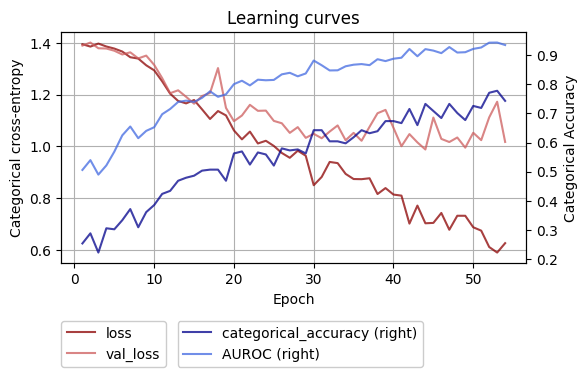

In [ ]:
# Plots the learning curves

# Create DataFrame object
df_hist = pd.DataFrame.from_dict(history4B.history)
df_hist["Epoch"] = np.arange(1, len(df_hist) + 1, 1)
# Plot learning curves
secondary_y = ['categorical_accuracy', 'AUROC']  #  ["AUROC", "val_AUROC"] 
ax = df_hist.plot(x="Epoch", y=['loss', 'val_loss'] + secondary_y,
                  secondary_y = secondary_y,
                  kind="line", figsize=(6, 3), grid=True, legend=True,
                  ylabel="Categorical cross-entropy", 
                  xlabel="Epoch", title="Learning curves",                  
                  color=['darkred', 'indianred', "darkblue", "royalblue"], alpha=0.75, fontsize=10)
ax.right_ax.set_ylabel("Categorical Accuracy")
ax.right_ax.legend(loc=(0.25, -0.45), framealpha=1.0)
ax.legend(loc=(0, -0.45), framealpha=1.0)
plt.show()

Evaluating on Test Set

In [ ]:
test_loss, test_categorical_accuracy, test_AUROC = model_4B.evaluate(ds_test)
print('Test Loss:', test_loss)
print('Test Categorical Accuracy:', test_categorical_accuracy) 
print('Test AUROC:', test_AUROC)

2/2 [==============================] - 1s 12ms/step - loss: 1.4901 - categorical_accuracy: 0.5000 - AUROC: 0.7706
Test Loss: 1.4900751113891602
Test Categorical Accuracy: 0.5
Test AUROC: 0.7706250548362732


## **Model 4C**

Model Arquitecture and Compiling

In [ ]:
with tf.device(device_name):
  
  model_4C = tf.keras.Sequential()

  model_4C.add(tf.keras.Input(shape=(256, 256, 3))) # Input layer
  model_4C.add(preprocessing) # Pixel normalization
  model_4C.add(augmentation) # Image augmentation
  model_4C.add(tf.keras.layers.Conv2D(32*input_shape[-1], 5, strides=2, padding='same', activation='relu')) # 1st conv hidden layer
  model_4C.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 1st pooling layer
  model_4C.add(tf.keras.layers.Conv2D(64*input_shape[-1], 5, strides=2, padding='same', activation='relu')) # 2nd conv hidden layer
  model_4C.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 2nd pooling layer
  model_4C.add(tf.keras.layers.Conv2D(128*input_shape[-1], 5, strides=2, padding='same', activation='relu')) # 3rd conv hidden layer
  model_4C.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 3rd pooling layer
  model_4C.add(tf.keras.layers.Flatten())
  model_4C.add(tf.keras.layers.Dense(120, activation='relu')) # 1st dense hidden layer
  model_4C.add(tf.keras.layers.Dense(84, activation='relu')) # 2nd dense hidden layer
  model_4C.add(tf.keras.layers.Dense(4, activation='softmax')) # Output layer

  model_4C.summary()

  learning_rate = 0.0001  
  model_4C.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
                  loss=tf.keras.losses.CategoricalCrossentropy(), 
                  metrics=[tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),tf.keras.metrics.AUC(name='AUROC')])

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 preprocessing (Sequential)  (None, 256, 256, 3)       0         
                                                                 
 my_augmentation_pipeline (S  (None, 256, 256, 3)      0         
 equential)                                                      
                                                                 
 conv2d_22 (Conv2D)          (None, 128, 128, 96)      7296      
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 64, 64, 96)       0         
 g2D)                                                            
                                                                 
 conv2d_23 (Conv2D)          (None, 32, 32, 192)       460992    
                                                                 
 max_pooling2d_21 (MaxPoolin  (None, 16, 16, 192)     

Model Trainning

In [ ]:
# Model training (Fits the model on ds_train. Uses ds_val for validation.)
epochs = 100
history4C = model_4C.fit(ds_train, epochs=epochs, validation_data=ds_val, callbacks=callbacks, verbose=1)

Epoch 1/100
9/9 [==============================] - 7s 150ms/step - loss: 1.8548 - categorical_accuracy: 0.2708 - AUROC: 0.5079 - val_loss: 1.3863 - val_categorical_accuracy: 0.2500 - val_AUROC: 0.4844
Epoch 2/100
9/9 [==============================] - 4s 109ms/step - loss: 1.4537 - categorical_accuracy: 0.2847 - AUROC: 0.5322 - val_loss: 1.3881 - val_categorical_accuracy: 0.2500 - val_AUROC: 0.4464
Epoch 3/100
9/9 [==============================] - 4s 110ms/step - loss: 1.4620 - categorical_accuracy: 0.2396 - AUROC: 0.4769 - val_loss: 1.3881 - val_categorical_accuracy: 0.2500 - val_AUROC: 0.4678
Epoch 4/100
9/9 [==============================] - 4s 119ms/step - loss: 1.4393 - categorical_accuracy: 0.2014 - AUROC: 0.4622 - val_loss: 1.3864 - val_categorical_accuracy: 0.2639 - val_AUROC: 0.4954
Epoch 5/100
9/9 [==============================] - 4s 110ms/step - loss: 1.4068 - categorical_accuracy: 0.2188 - AUROC: 0.5034 - val_loss: 1.3866 - val_categorical_accuracy: 0.2361 - val_AUROC: 0.

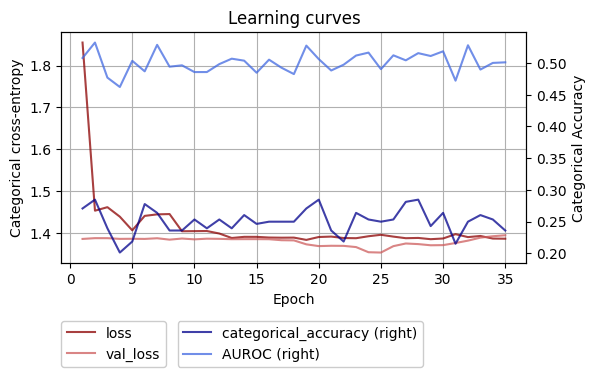

In [ ]:
# Plots the learning curves

# Create DataFrame object
df_hist = pd.DataFrame.from_dict(history4C.history)
df_hist["Epoch"] = np.arange(1, len(df_hist) + 1, 1)
# Plot learning curves
secondary_y = ['categorical_accuracy', 'AUROC']  #  ["AUROC", "val_AUROC"] 
ax = df_hist.plot(x="Epoch", y=['loss', 'val_loss'] + secondary_y,
                  secondary_y = secondary_y,
                  kind="line", figsize=(6, 3), grid=True, legend=True,
                  ylabel="Categorical cross-entropy", 
                  xlabel="Epoch", title="Learning curves",                  
                  color=['darkred', 'indianred', "darkblue", "royalblue"], alpha=0.75, fontsize=10)
ax.right_ax.set_ylabel("Categorical Accuracy")
ax.right_ax.legend(loc=(0.25, -0.45), framealpha=1.0)
ax.legend(loc=(0, -0.45), framealpha=1.0)
plt.show()

Evaluating on Test Set

In [ ]:
test_loss, test_categorical_accuracy, test_AUROC = model_4C.evaluate(ds_test)
print('Test Loss:', test_loss)
print('Test Categorical Accuracy:', test_categorical_accuracy) 
print('Test AUROC:', test_AUROC)

2/2 [==============================] - 1s 12ms/step - loss: 1.3894 - categorical_accuracy: 0.2500 - AUROC: 0.5225
Test Loss: 1.389448642730713
Test Categorical Accuracy: 0.25
Test AUROC: 0.5225000381469727


# **4. Hyperparameter Tunning**

## **Bayesian Optimization**

In [ ]:
with tf.device(device_name):

  # Define the model builder function
  def build_model(hp):
      model = tf.keras.Sequential()
      model.add(tf.keras.Input(shape=(256, 256, 3)))
      model.add(preprocessing)

      # Tune number of filters, filter size, strides, and padding for conv layers
      for i in range(3):
          filters = hp.Int(f'conv_{i}_filters', min_value=32, max_value=256, step=32)
          filter_size = hp.Choice(f'conv_{i}_filter_size', values=[3, 5, 11])
          strides = hp.Choice(f'conv_{i}_strides', values=[1, 2])
          padding = hp.Choice(f'conv_{i}_padding', values=['same', 'valid'])
          activation = hp.Choice(f'conv_{i}_activation', values=['relu', 'sigmoid'])

          model.add(layers.Conv2D(filters=filters*input_shape[-1],
                                  kernel_size=filter_size,
                                  strides=strides,
                                  padding=padding,
                                  activation=activation))

          # Add pooling layer after each conv layer
          model.add(layers.MaxPooling2D(pool_size=(2, 2), strides=2))

      model.add(layers.Flatten())

      # Tune number of neurons for dense layers
      for i in range(2):
          neurons = hp.Int(f'dense_{i}_neurons', min_value=64, max_value=512, step=64)
          activation = hp.Choice(f'dense_{i}_activation', values=['relu', 'sigmoid'])
          model.add(layers.Dense(units=neurons, activation=activation))

          # Add dropout layer after second dense layer
          if i == 1:
              dropout_rate = hp.Float(f'dropout_rate', min_value=0.0, max_value=0.5, step=0.1)
              model.add(layers.Dropout(rate=dropout_rate))

      model.add(layers.Dense(units=4, activation='softmax'))

      # Tune learning rate and optimizer
      learning_rate = hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='log')
      optimizer = hp.Choice('optimizer', values=['adam', 'rmsprop', 'sgd'])

      # compile the model with the hyperparameters
      model.compile(optimizer=optimizer,
                    loss=tf.keras.losses.CategoricalCrossentropy(), 
                    metrics=[tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy')])

      return model

  # Define the search space
  tuner = BayesianOptimization(
      build_model,
      objective='val_categorical_accuracy',
      max_trials=100)

  # search for the best hyperparameters
  tuner.search(ds_train,
              epochs=50,
              validation_data=ds_val)

  # Print the best model's summary
  tuner.results_summary()
  best_model = tuner.get_best_models(num_models=1)[0]
  best_model.summary()

  # Train the best model on the whole dataset
  best_model.fit(ds_train, epochs=100, batch_size=32)

Trial 100 Complete [00h 03m 22s]
val_categorical_accuracy: 0.3055555522441864

Best val_categorical_accuracy So Far: 0.5694444179534912
Total elapsed time: 06h 58m 37s
Results summary
Results in ./untitled_project
Showing 10 best trials
Objective(name="val_categorical_accuracy", direction="max")

Trial 034 summary
Hyperparameters:
conv_0_filters: 32
conv_0_filter_size: 11
conv_0_strides: 2
conv_0_padding: valid
conv_0_activation: relu
conv_1_filters: 192
conv_1_filter_size: 3
conv_1_strides: 1
conv_1_padding: valid
conv_1_activation: relu
conv_2_filters: 160
conv_2_filter_size: 5
conv_2_strides: 1
conv_2_padding: valid
conv_2_activation: relu
dense_0_neurons: 256
dense_0_activation: relu
dense_1_neurons: 448
dense_1_activation: relu
dropout_rate: 0.30000000000000004
learning_rate: 0.0011485508809093417
optimizer: sgd
Score: 0.5694444179534912

Trial 077 summary
Hyperparameters:
conv_0_filters: 32
conv_0_filter_size: 11
conv_0_strides: 2
conv_0_padding: valid
conv_0_activation: relu
con

### **Bayesian Optimization Results - Two best trials**

Trial 100 Complete [00h 03m 22s]
val_categorical_accuracy: 0.3055555522441864

Best val_categorical_accuracy So Far: 0.5694444179534912
Total elapsed time: 06h 58m 37s
Results summary
Results in ./untitled_project
Showing 10 best trials
Objective(name="val_categorical_accuracy", direction="max")

Trial 034 summary
Hyperparameters:
conv_0_filters: 32
conv_0_filter_size: 11
conv_0_strides: 2
conv_0_padding: valid
conv_0_activation: relu
conv_1_filters: 192
conv_1_filter_size: 3
conv_1_strides: 1
conv_1_padding: valid
conv_1_activation: relu
conv_2_filters: 160
conv_2_filter_size: 5
conv_2_strides: 1
conv_2_padding: valid
conv_2_activation: relu
dense_0_neurons: 256
dense_0_activation: relu
dense_1_neurons: 448
dense_1_activation: relu
dropout_rate: 0.30000000000000004
learning_rate: 0.0011485508809093417
optimizer: sgd
Score: 0.5694444179534912

Trial 077 summary
Hyperparameters:
conv_0_filters: 32
conv_0_filter_size: 11
conv_0_strides: 2
conv_0_padding: valid
conv_0_activation: relu
conv_1_filters: 192
conv_1_filter_size: 3
conv_1_strides: 1
conv_1_padding: valid
conv_1_activation: relu
conv_2_filters: 160
conv_2_filter_size: 5
conv_2_strides: 1
conv_2_padding: valid
conv_2_activation: relu
dense_0_neurons: 256
dense_0_activation: relu
dense_1_neurons: 448
dense_1_activation: relu
dropout_rate: 0.30000000000000004
learning_rate: 0.0013467745751127491
optimizer: sgd
Score: 0.5694444179534912

### **Trying the best hypertuned Models**

### **Model 34**

Model Arquitecture and Compiling

In [ ]:
with tf.device(device_name):
  
  model_34 = tf.keras.Sequential()

  model_34.add(tf.keras.Input(shape=(256, 256, 3))) # Input layer
  model_34.add(preprocessing) # Pixel normalization
  model_34.add(tf.keras.layers.Conv2D(32*input_shape[-1], 11, strides=2, padding='valid', activation='relu')) # 1st conv hidden layer
  model_34.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 1st pooling layer
  model_34.add(tf.keras.layers.Conv2D(192*input_shape[-1], 3, strides=1, padding='valid', activation='relu')) # 2nd conv hidden layer
  model_34.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 2nd pooling layer
  model_34.add(tf.keras.layers.Conv2D(160*input_shape[-1], 5, strides=1, padding='valid', activation='relu')) # 3rd conv hidden layer
  model_34.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 3rd pooling layer
  model_34.add(tf.keras.layers.Flatten())
  model_34.add(tf.keras.layers.Dense(256, activation='relu')) # 1st dense hidden layer
  model_34.add(tf.keras.layers.Dense(448, activation='relu')) # 2nd dense hidden layer
  model_34.add(tf.keras.layers.Dropout(0.3)) # Dropout layer 
  model_34.add(tf.keras.layers.Dense(4, activation='softmax')) # Output layer

  model_34.summary()

  learning_rate = 0.0011485508809093417
  model_34.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=learning_rate), 
                  loss=tf.keras.losses.CategoricalCrossentropy(), 
                  metrics=[tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),tf.keras.metrics.AUC(name='AUROC')])

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 preprocessing (Sequential)  (None, 256, 256, 3)       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 123, 123, 96)      34944     
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 61, 61, 96)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 59, 59, 576)       498240    
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 29, 29, 576)      0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 25, 25, 480)      

Model Trainning

In [ ]:
# Model training (Fits the model on ds_train. Uses ds_val for validation.)
epochs = 500
history34 = model_34.fit(ds_train, epochs=epochs, validation_data=ds_val, callbacks=callbacks, verbose=1)

Epoch 1/500
9/9 [==============================] - 5s 162ms/step - loss: 1.3901 - categorical_accuracy: 0.2465 - AUROC: 0.4842 - val_loss: 1.3900 - val_categorical_accuracy: 0.2083 - val_AUROC: 0.4733
Epoch 2/500
9/9 [==============================] - 4s 123ms/step - loss: 1.3889 - categorical_accuracy: 0.2569 - AUROC: 0.4928 - val_loss: 1.3898 - val_categorical_accuracy: 0.2083 - val_AUROC: 0.4636
Epoch 3/500
9/9 [==============================] - 4s 124ms/step - loss: 1.3886 - categorical_accuracy: 0.2569 - AUROC: 0.4962 - val_loss: 1.3895 - val_categorical_accuracy: 0.2083 - val_AUROC: 0.4944
Epoch 4/500
9/9 [==============================] - 4s 121ms/step - loss: 1.3886 - categorical_accuracy: 0.2639 - AUROC: 0.4858 - val_loss: 1.3891 - val_categorical_accuracy: 0.2083 - val_AUROC: 0.4733
Epoch 5/500
9/9 [==============================] - 4s 135ms/step - loss: 1.3864 - categorical_accuracy: 0.2569 - AUROC: 0.4993 - val_loss: 1.3892 - val_categorical_accuracy: 0.2083 - val_AUROC: 0.

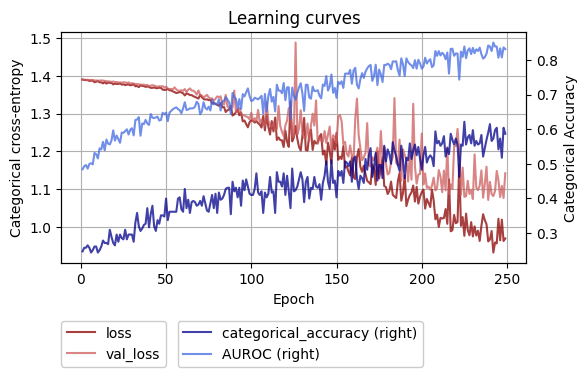

In [ ]:
# Plots the learning curves

# Create DataFrame object
df_hist = pd.DataFrame.from_dict(history34.history)
df_hist["Epoch"] = np.arange(1, len(df_hist) + 1, 1)
# Plot learning curves
secondary_y = ['categorical_accuracy', 'AUROC']  #  ["AUROC", "val_AUROC"] 
ax = df_hist.plot(x="Epoch", y=['loss', 'val_loss'] + secondary_y,
                  secondary_y = secondary_y,
                  kind="line", figsize=(6, 3), grid=True, legend=True,
                  ylabel="Categorical cross-entropy", 
                  xlabel="Epoch", title="Learning curves",                  
                  color=['darkred', 'indianred', "darkblue", "royalblue"], alpha=0.75, fontsize=10)
ax.right_ax.set_ylabel("Categorical Accuracy")
ax.right_ax.legend(loc=(0.25, -0.45), framealpha=1.0)
ax.legend(loc=(0, -0.45), framealpha=1.0)
plt.show()

Evaluating in Test Set

In [ ]:
test_loss, test_categorical_accuracy, test_AUROC = model_34.evaluate(ds_test)
print('Test Loss:', test_loss)
print('Test Categorical Accuracy:', test_categorical_accuracy) 
print('Test AUROC:', test_AUROC)

2/2 [==============================] - 0s 14ms/step - loss: 1.2242 - categorical_accuracy: 0.5250 - AUROC: 0.7516
Test Loss: 1.2242451906204224
Test Categorical Accuracy: 0.5249999761581421
Test AUROC: 0.7515625357627869


### **Model 77**

Model Arquitecture and Compiling

In [ ]:
with tf.device(device_name):
  
  model_77= tf.keras.Sequential()

  model_77.add(tf.keras.Input(shape=(256, 256, 3))) # Input layer
  model_77.add(preprocessing) # Pixel normalization
  model_77.add(tf.keras.layers.Conv2D(32*input_shape[-1], 11, strides=2, padding='valid', activation='relu')) # 1st conv hidden layer
  model_77.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 1st pooling layer
  model_77.add(tf.keras.layers.Conv2D(192*input_shape[-1], 3, strides=1, padding='valid', activation='relu')) # 2nd conv hidden layer
  model_77.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 2nd pooling layer
  model_77.add(tf.keras.layers.Conv2D(160*input_shape[-1], 5, strides=1, padding='valid', activation='relu')) # 3rd conv hidden layer
  model_77.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2)) # 3rd pooling layer
  model_77.add(tf.keras.layers.Flatten())
  model_77.add(tf.keras.layers.Dense(256, activation='relu')) # 1st dense hidden layer
  model_77.add(tf.keras.layers.Dense(448, activation='relu')) # 2nd dense hidden layer
  model_77.add(tf.keras.layers.Dropout(0.3)) # Dropout layer 
  model_77.add(tf.keras.layers.Dense(4, activation='softmax')) # Output layer

  model_77.summary()

  learning_rate = 0.0013467745751127491 
  model_77.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=learning_rate), 
                  loss=tf.keras.losses.CategoricalCrossentropy(), 
                  metrics=[tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),tf.keras.metrics.AUC(name='AUROC')])

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 preprocessing (Sequential)  (None, 256, 256, 3)       0         
                                                                 
 conv2d_12 (Conv2D)          (None, 123, 123, 96)      34944     
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 61, 61, 96)       0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 59, 59, 576)       498240    
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 29, 29, 576)      0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 25, 25, 480)      

Trainning Model

In [ ]:
# Model training (Fits the model on ds_train. Uses ds_val for validation.)
epochs = 500
history77 = model_77.fit(ds_train, epochs=epochs, validation_data=ds_val, callbacks=callbacks, verbose=1)

Epoch 1/500
9/9 [==============================] - 5s 149ms/step - loss: 1.3874 - categorical_accuracy: 0.2465 - AUROC: 0.4982 - val_loss: 1.3881 - val_categorical_accuracy: 0.2917 - val_AUROC: 0.4544
Epoch 2/500
9/9 [==============================] - 4s 124ms/step - loss: 1.3851 - categorical_accuracy: 0.2535 - AUROC: 0.5154 - val_loss: 1.3878 - val_categorical_accuracy: 0.2083 - val_AUROC: 0.4730
Epoch 3/500
9/9 [==============================] - 4s 122ms/step - loss: 1.3873 - categorical_accuracy: 0.2500 - AUROC: 0.4955 - val_loss: 1.3882 - val_categorical_accuracy: 0.2083 - val_AUROC: 0.4785
Epoch 4/500
9/9 [==============================] - 4s 132ms/step - loss: 1.3876 - categorical_accuracy: 0.2222 - AUROC: 0.4895 - val_loss: 1.3874 - val_categorical_accuracy: 0.2083 - val_AUROC: 0.4872
Epoch 5/500
9/9 [==============================] - 4s 122ms/step - loss: 1.3864 - categorical_accuracy: 0.2431 - AUROC: 0.5096 - val_loss: 1.3882 - val_categorical_accuracy: 0.2083 - val_AUROC: 0.

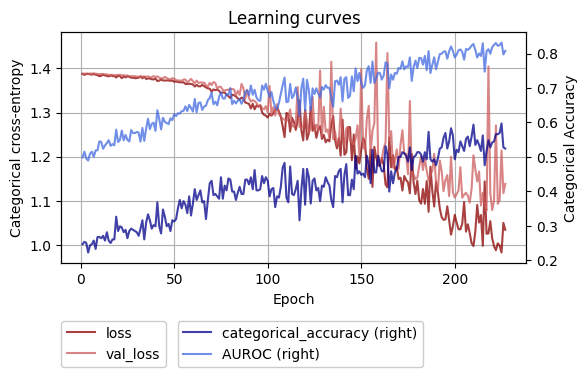

In [ ]:
# Plots the learning curves

# Create DataFrame object
df_hist = pd.DataFrame.from_dict(history77.history)
df_hist["Epoch"] = np.arange(1, len(df_hist) + 1, 1)
# Plot learning curves
secondary_y = ['categorical_accuracy', 'AUROC']  #  ["AUROC", "val_AUROC"] 
ax = df_hist.plot(x="Epoch", y=['loss', 'val_loss'] + secondary_y,
                  secondary_y = secondary_y,
                  kind="line", figsize=(6, 3), grid=True, legend=True,
                  ylabel="Categorical cross-entropy", 
                  xlabel="Epoch", title="Learning curves",                  
                  color=['darkred', 'indianred', "darkblue", "royalblue"], alpha=0.75, fontsize=10)
ax.right_ax.set_ylabel("Categorical Accuracy")
ax.right_ax.legend(loc=(0.25, -0.45), framealpha=1.0)
ax.legend(loc=(0, -0.45), framealpha=1.0)
plt.show()

Evaluating in Test Set

In [ ]:
test_loss, test_categorical_accuracy, test_AUROC = model_77.evaluate(ds_test)
print('Test Loss:', test_loss)
print('Test Categorical Accuracy:', test_categorical_accuracy) 
print('Test AUROC:', test_AUROC)

2/2 [==============================] - 0s 13ms/step - loss: 1.2107 - categorical_accuracy: 0.4750 - AUROC: 0.7472
Test Loss: 1.2107365131378174
Test Categorical Accuracy: 0.4749999940395355
Test AUROC: 0.7471874952316284


## **5. Transfer Learning**

Transfer Learning consists of fine-tuning a pre-trained model's parameters to adapt to a similar problem.

After taking layers from a previously trained model, the technique freezes them to avoid loss of information for future training. The next step consists in adding new trainable layers, therefore, they will learn how to transform old features in a new prediction dataset. Transfer learning is useful to deal with the vanishing gradient problem that occurs during deep neural network training using backpropagation: the gradient of the loss function will be calculated to update the parameters, but it is reduced in the earlier layers, impairing the effectiveness of training and consequently taking a long learning time in the conventional backpropagation, according to Hochreiter(1998).

In this project, we will be implementing and comparing two state-of-the-art deep learning models for image classification: ResNet50 and VGG16. These models have been widely used in various computer vision tasks and have achieved remarkable results.

ResNet was proposed by Kaiming He, Xiangyu Zhang, Shaoqing Ren, and Jian Sun in a Microshof Research (Deep Residual Learning for Image Recognition-2015). ResNet involves multiple blocks with the concept of skip connection that add the original input to the output of the conventional block. Additionally is followed by a batch normalization layer and a relu activation function.

VGG(Visual Geometry Group) is described as "the evaluation of networks of increasing depth using an architecture with very small (3×3) convolution filters, which shows that a significant improvement on the prior-art configurations can be achieved by pushing the depth to 16–19 weight layers."(p. 79).(Simonyan & Zisserman, 2015, p.1)

Sources:

https://keras.io/guides/transfer_learning/

He, K., Zhang, X., Ren, S., & Sun, J. Deep Residual, 2016, "Learning for Image Recognition". [Online] Available: https://www.researchgate.net/publication/311609041_Deep_Residual_Learning_for_Image_Recognition[Accessed: 08-Apr-2023]

Hochreiter, S., 1998, "The Vanishing Gradient Problem During Learning Recurrent Neural Nets and Problem Solutions"[Online]. Available: https://www.researchgate.net/publication/220355039_The_Vanishing_Gradient_Problem_During_Learning_Recurrent_Neural_Nets_and_Problem_Solutions[Accessed: 08-Apr-2023]

Simonyan, K., & Zisserman, A., 2015, "Very Deep Convolutional Networks for Large-Scale Image Recognition"[Online]. Available: https://www.researchgate.net/publication/265385906_Very_Deep_Convolutional_Networks_for_Large-Scale_Image_Recognition[Accessed: 08-Apr-2023]

## **ResNet50**

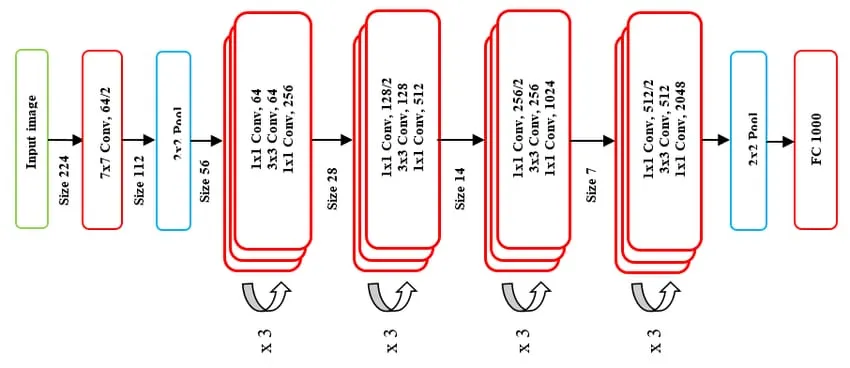

Figure Source: https://towardsdatascience.com/the-annotated-resnet-50-a6c536034758

**Model RN1**

In this model we will  only update the input and output layers

Model Arquitecture and Compiling

In [ ]:
# Load pre-trained model
RN50 = ResNet50(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

# Add new layers on top of the pre-trained model
x = RN50.output
x = Flatten()(x)
predictions = Dense(4, activation='softmax')(x)

# Freeze the weights of the pre-trained layers
for layer in RN50.layers:
    layer.trainable = False

# Define the new model
model_RN1 = Model(inputs=RN50.input, outputs=predictions)

learning_rate = 0.001  
model_RN1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
                loss=tf.keras.losses.CategoricalCrossentropy(), 
                metrics=[tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),tf.keras.metrics.AUC(name='AUROC')])

Model Trainning

In [ ]:
# Model training (Fits the model on ds_train. Uses ds_val for validation.)
epochs = 100
historyRN1 = model_RN1.fit(ds_train, epochs=epochs, validation_data=ds_val, callbacks=callbacks, verbose=1)

Epoch 1/100
9/9 [==============================] - 8s 250ms/step - loss: 11.7325 - categorical_accuracy: 0.4514 - AUROC: 0.6486 - val_loss: 9.0808 - val_categorical_accuracy: 0.5139 - val_AUROC: 0.7106
Epoch 2/100
9/9 [==============================] - 4s 131ms/step - loss: 3.2083 - categorical_accuracy: 0.7361 - AUROC: 0.8619 - val_loss: 6.1491 - val_categorical_accuracy: 0.6667 - val_AUROC: 0.7997
Epoch 3/100
9/9 [==============================] - 4s 120ms/step - loss: 0.9609 - categorical_accuracy: 0.8819 - AUROC: 0.9512 - val_loss: 5.0623 - val_categorical_accuracy: 0.6667 - val_AUROC: 0.8132
Epoch 4/100
9/9 [==============================] - 4s 120ms/step - loss: 0.3694 - categorical_accuracy: 0.9653 - AUROC: 0.9873 - val_loss: 4.1589 - val_categorical_accuracy: 0.7222 - val_AUROC: 0.8374
Epoch 5/100
9/9 [==============================] - 4s 120ms/step - loss: 0.0701 - categorical_accuracy: 0.9896 - AUROC: 0.9976 - val_loss: 4.4464 - val_categorical_accuracy: 0.7083 - val_AUROC: 0

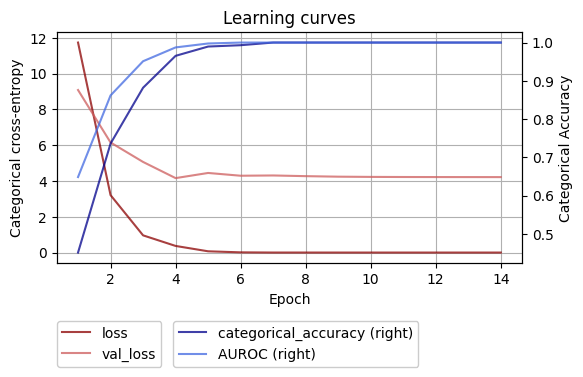

In [ ]:
# Plots the learning curves

# Create DataFrame object
df_hist = pd.DataFrame.from_dict(historyRN1.history)
df_hist["Epoch"] = np.arange(1, len(df_hist) + 1, 1)
# Plot learning curves
secondary_y = ['categorical_accuracy', 'AUROC']  #  ["AUROC", "val_AUROC"] 
ax = df_hist.plot(x="Epoch", y=['loss', 'val_loss'] + secondary_y,
                  secondary_y = secondary_y,
                  kind="line", figsize=(6, 3), grid=True, legend=True,
                  ylabel="Categorical cross-entropy", 
                  xlabel="Epoch", title="Learning curves",                  
                  color=['darkred', 'indianred', "darkblue", "royalblue"], alpha=0.75, fontsize=10)
ax.right_ax.set_ylabel("Categorical Accuracy")
ax.right_ax.legend(loc=(0.25, -0.45), framealpha=1.0)
ax.legend(loc=(0, -0.45), framealpha=1.0)
plt.show()

As we can see, Model RN1 is overfitting, therefore we will try some additions to see if we can make it work better in our dataset.

**Model RN2**

Let's add one more hidden layer followed by a dropout layer, to try to reduce overfitting

Model Arquitecture and Compiling

In [ ]:
# Load pre-trained model
RN50 = ResNet50(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

# Add new layers on top of the pre-trained model
x = RN50.output
x = Flatten()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(rate=0.2)(x)
predictions = Dense(4, activation='softmax')(x)

# Freeze the weights of the pre-trained layers
for layer in RN50.layers:
    layer.trainable = False

# Define the new model
model_RN2 = Model(inputs=RN50.input, outputs=predictions)

learning_rate = 0.001  
model_RN2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
                loss=tf.keras.losses.CategoricalCrossentropy(), 
                metrics=[tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),tf.keras.metrics.AUC(name='AUROC')])

Model Trainning

In [ ]:
# Model training (Fits the model on ds_train. Uses ds_val for validation.)
epochs = 100
historyRN2 = model_RN2.fit(ds_train, epochs=epochs, validation_data=ds_val, callbacks=callbacks, verbose=1)

Epoch 1/100
9/9 [==============================] - 9s 263ms/step - loss: 63.0191 - categorical_accuracy: 0.2847 - AUROC: 0.5432 - val_loss: 16.5990 - val_categorical_accuracy: 0.5278 - val_AUROC: 0.6953
Epoch 2/100
9/9 [==============================] - 4s 128ms/step - loss: 6.2479 - categorical_accuracy: 0.6840 - AUROC: 0.8013 - val_loss: 6.4653 - val_categorical_accuracy: 0.5833 - val_AUROC: 0.7529
Epoch 3/100
9/9 [==============================] - 4s 131ms/step - loss: 2.5845 - categorical_accuracy: 0.7743 - AUROC: 0.8923 - val_loss: 3.8759 - val_categorical_accuracy: 0.6944 - val_AUROC: 0.8239
Epoch 4/100
9/9 [==============================] - 4s 130ms/step - loss: 1.1491 - categorical_accuracy: 0.8542 - AUROC: 0.9372 - val_loss: 3.9292 - val_categorical_accuracy: 0.5972 - val_AUROC: 0.7839
Epoch 5/100
9/9 [==============================] - 4s 120ms/step - loss: 0.3408 - categorical_accuracy: 0.9340 - AUROC: 0.9777 - val_loss: 2.0708 - val_categorical_accuracy: 0.7500 - val_AUROC: 

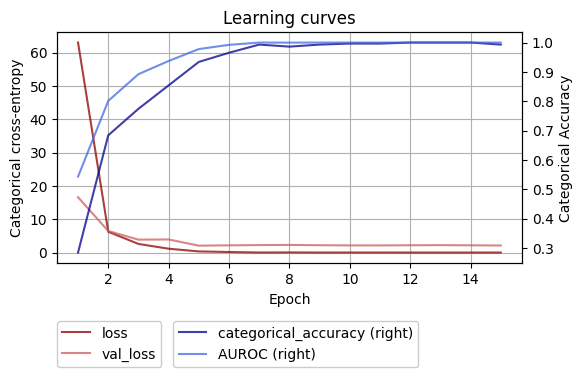

In [ ]:
# Plots the learning curves

# Create DataFrame object
df_hist = pd.DataFrame.from_dict(historyRN2.history)
df_hist["Epoch"] = np.arange(1, len(df_hist) + 1, 1)
# Plot learning curves
secondary_y = ['categorical_accuracy', 'AUROC']  #  ["AUROC", "val_AUROC"] 
ax = df_hist.plot(x="Epoch", y=['loss', 'val_loss'] + secondary_y,
                  secondary_y = secondary_y,
                  kind="line", figsize=(6, 3), grid=True, legend=True,
                  ylabel="Categorical cross-entropy", 
                  xlabel="Epoch", title="Learning curves",                  
                  color=['darkred', 'indianred', "darkblue", "royalblue"], alpha=0.75, fontsize=10)
ax.right_ax.set_ylabel("Categorical Accuracy")
ax.right_ax.legend(loc=(0.25, -0.45), framealpha=1.0)
ax.legend(loc=(0, -0.45), framealpha=1.0)
plt.show()

With this adjustment, overfitting was barely reduced.

**Model RN3**

Let's try adding L2 regularization and increasing the dropout rate

Model Arquitecture and Compiling

In [ ]:
with tf.device(device_name):
  model_RN3 = Sequential()

  pretrained_model= tf.keras.applications.ResNet50(include_top=False,
                    input_shape=(256, 256, 3),
                    pooling='avg',classes=4,
                    weights='imagenet')
  for layer in pretrained_model.layers:
          layer.trainable=False

  model_RN3.add(pretrained_model)
  model_RN3.add(Flatten())
  model_RN3.add(Dense(512, activation='relu', kernel_regularizer=l2(0.01)))
  model_RN3.add(Dropout(0.5))
  model_RN3.add(Dense(4, activation='softmax'))
  model_RN3.summary()

  # compile
  learning_rate = 0.001  
  model_RN3.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
                loss=tf.keras.losses.CategoricalCrossentropy(), 
                metrics=[tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),tf.keras.metrics.AUC(name='AUROC')])


Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 flatten_16 (Flatten)        (None, 2048)              0         
                                                                 
 dense_34 (Dense)            (None, 512)               1049088   
                                                                 
 dropout_13 (Dropout)        (None, 512)               0         
                                                                 
 dense_35 (Dense)            (None, 4)                 2052      
                                                                 
Total params: 24,638,852
Trainable params: 1,051,140
Non-trainable params: 23,587,712
_________________________________________________________________


Model Trainning

In [ ]:
  # Model training 
  epochs = 100
  historyRN3 =model_RN3.fit(ds_train, epochs=epochs, validation_data=ds_val, callbacks=callbacks, verbose=1)

Epoch 1/100
9/9 [==============================] - 9s 254ms/step - loss: 8.9962 - categorical_accuracy: 0.4271 - AUROC: 0.6958 - val_loss: 7.0932 - val_categorical_accuracy: 0.6667 - val_AUROC: 0.8791
Epoch 2/100
9/9 [==============================] - 4s 122ms/step - loss: 6.5760 - categorical_accuracy: 0.6215 - AUROC: 0.8528 - val_loss: 5.5494 - val_categorical_accuracy: 0.6528 - val_AUROC: 0.9020
Epoch 3/100
9/9 [==============================] - 4s 128ms/step - loss: 5.0466 - categorical_accuracy: 0.6771 - AUROC: 0.9025 - val_loss: 4.3838 - val_categorical_accuracy: 0.7639 - val_AUROC: 0.9254
Epoch 4/100
9/9 [==============================] - 4s 120ms/step - loss: 3.9309 - categorical_accuracy: 0.7986 - AUROC: 0.9460 - val_loss: 3.5763 - val_categorical_accuracy: 0.7917 - val_AUROC: 0.9367
Epoch 5/100
9/9 [==============================] - 4s 120ms/step - loss: 3.1903 - categorical_accuracy: 0.8021 - AUROC: 0.9650 - val_loss: 2.9990 - val_categorical_accuracy: 0.7917 - val_AUROC: 0.

In [ ]:
# Plots the learning curves

# Create DataFrame object
df_hist = pd.DataFrame.from_dict(historyRN3.history)
df_hist["Epoch"] = np.arange(1, len(df_hist) + 1, 1)
# Plot learning curves
secondary_y = ['categorical_accuracy', 'AUROC']  #  ["AUROC", "val_AUROC"] 
ax = df_hist.plot(x="Epoch", y=['loss', 'val_loss'] + secondary_y,
                  secondary_y = secondary_y,
                  kind="line", figsize=(6, 3), grid=True, legend=True,
                  ylabel="Categorical cross-entropy", 
                  xlabel="Epoch", title="Learning curves",                  
                  color=['darkred', 'indianred', "darkblue", "royalblue"], alpha=0.75, fontsize=10)
ax.right_ax.set_ylabel("Categorical Accuracy")
ax.right_ax.legend(loc=(0.25, -0.45), framealpha=1.0)
ax.legend(loc=(0, -0.45), framealpha=1.0)
plt.show()

With this adjustment, the difference between trainning and validation accuracies went from 30% to 16%.

Evaluating on Test Set

In [ ]:
test_loss, test_categorical_accuracy, test_AUROC = model_RN3.evaluate(ds_test)
print('Test Loss:', test_loss)
print('Test Categorical Accuracy:', test_categorical_accuracy) 
print('Test AUROC:', test_AUROC)

2/2 [==============================] - 0s 19ms/step - loss: 2.2954 - categorical_accuracy: 0.5250 - AUROC: 0.7769
Test Loss: 2.295410633087158
Test Categorical Accuracy: 0.5249999761581421
Test AUROC: 0.7768749594688416


**Model RN4**

Let's try adding BatchNormalization instead

Model Arquitecture and Compiling

In [ ]:
# Load pre-trained model
RN50 = ResNet50(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

# Add new layers on top of the pre-trained model
x = RN50.output
x = Flatten()(x)
x = Dense(512, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(rate=0.2)(x)
predictions = Dense(4, activation='softmax')(x)

# Freeze the weights of the pre-trained layers
for layer in RN50.layers:
    layer.trainable = False

# Define the new model
model_RN4 = Model(inputs=RN50.input, outputs=predictions)

learning_rate = 0.001  
model_RN4.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
                loss=tf.keras.losses.CategoricalCrossentropy(), 
                metrics=[tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),tf.keras.metrics.AUC(name='AUROC')])


Model Trainning

In [ ]:
# Model training (Fits the model on ds_train. Uses ds_val for validation.)
epochs = 100
historyRN4 = model_RN4.fit(ds_train, epochs=epochs, validation_data=ds_val, callbacks=callbacks, verbose=1)

Epoch 1/100
9/9 [==============================] - 9s 254ms/step - loss: 2.1215 - categorical_accuracy: 0.5208 - AUROC: 0.7659 - val_loss: 6.1214 - val_categorical_accuracy: 0.6528 - val_AUROC: 0.7856
Epoch 2/100
9/9 [==============================] - 4s 130ms/step - loss: 0.2809 - categorical_accuracy: 0.8924 - AUROC: 0.9865 - val_loss: 2.7906 - val_categorical_accuracy: 0.6528 - val_AUROC: 0.8103
Epoch 3/100
9/9 [==============================] - 4s 121ms/step - loss: 0.1580 - categorical_accuracy: 0.9375 - AUROC: 0.9967 - val_loss: 1.6769 - val_categorical_accuracy: 0.6806 - val_AUROC: 0.8627
Epoch 4/100
9/9 [==============================] - 4s 120ms/step - loss: 0.0670 - categorical_accuracy: 0.9896 - AUROC: 0.9999 - val_loss: 1.2538 - val_categorical_accuracy: 0.7083 - val_AUROC: 0.8858
Epoch 5/100
9/9 [==============================] - 4s 122ms/step - loss: 0.0698 - categorical_accuracy: 0.9861 - AUROC: 0.9997 - val_loss: 1.1069 - val_categorical_accuracy: 0.7083 - val_AUROC: 0.

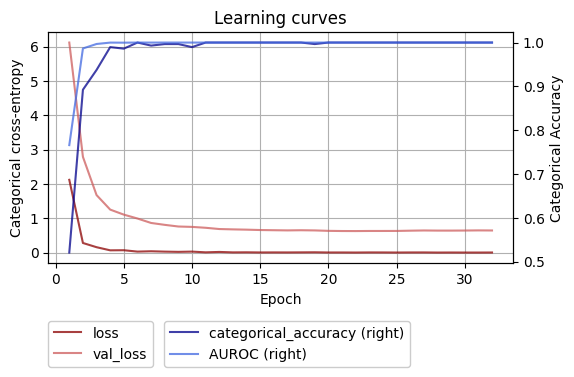

In [ ]:
# Plots the learning curves

# Create DataFrame object
df_hist = pd.DataFrame.from_dict(historyRN4.history)
df_hist["Epoch"] = np.arange(1, len(df_hist) + 1, 1)
# Plot learning curves
secondary_y = ['categorical_accuracy', 'AUROC']  #  ["AUROC", "val_AUROC"] 
ax = df_hist.plot(x="Epoch", y=['loss', 'val_loss'] + secondary_y,
                  secondary_y = secondary_y,
                  kind="line", figsize=(6, 3), grid=True, legend=True,
                  ylabel="Categorical cross-entropy", 
                  xlabel="Epoch", title="Learning curves",                  
                  color=['darkred', 'indianred', "darkblue", "royalblue"], alpha=0.75, fontsize=10)
ax.right_ax.set_ylabel("Categorical Accuracy")
ax.right_ax.legend(loc=(0.25, -0.45), framealpha=1.0)
ax.legend(loc=(0, -0.45), framealpha=1.0)
plt.show()

With this adjustment, the difference between trainning and validation accuracies went from 30% to 20%.

Evaluating on Test Set

In [ ]:
test_loss, test_categorical_accuracy, test_AUROC = model_RN4.evaluate(ds_test)
print('Test Loss:', test_loss)
print('Test Categorical Accuracy:', test_categorical_accuracy) 
print('Test AUROC:', test_AUROC)

2/2 [==============================] - 0s 19ms/step - loss: 1.4922 - categorical_accuracy: 0.6500 - AUROC: 0.8216
Test Loss: 1.4922136068344116
Test Categorical Accuracy: 0.6499999761581421
Test AUROC: 0.8215625286102295


**Model RN5**

Let's add image augmentation to see if we can improve our last model

Model Arquitecture and Compiling

In [ ]:
# Load pre-trained model
RN50 = ResNet50(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

# Add new layers on top of the pre-trained model
x = augmentation
x = RN50.output
x = Flatten()(x)
x = Dense(512, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(rate=0.2)(x)
predictions = Dense(4, activation='softmax')(x)

# Freeze the weights of the pre-trained layers
for layer in RN50.layers:
    layer.trainable = False

# Define the new model
model_RN5 = Model(inputs=RN50.input, outputs=predictions)

learning_rate = 0.001  
model_RN5.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
                loss=tf.keras.losses.CategoricalCrossentropy(), 
                metrics=[tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),tf.keras.metrics.AUC(name='AUROC')])


Model Trainning

In [ ]:
# Model training (Fits the model on ds_train. Uses ds_val for validation.)
epochs = 100
historyRN5 = model_RN5.fit(ds_train, epochs=epochs, validation_data=ds_val, callbacks=callbacks, verbose=1)

Epoch 1/100
9/9 [==============================] - 9s 270ms/step - loss: 1.9929 - categorical_accuracy: 0.5833 - AUROC: 0.7934 - val_loss: 15.3628 - val_categorical_accuracy: 0.4722 - val_AUROC: 0.6472
Epoch 2/100
9/9 [==============================] - 4s 121ms/step - loss: 0.3221 - categorical_accuracy: 0.9097 - AUROC: 0.9810 - val_loss: 3.4288 - val_categorical_accuracy: 0.5694 - val_AUROC: 0.7917
Epoch 3/100
9/9 [==============================] - 4s 122ms/step - loss: 0.1143 - categorical_accuracy: 0.9653 - AUROC: 0.9987 - val_loss: 1.7444 - val_categorical_accuracy: 0.6944 - val_AUROC: 0.8613
Epoch 4/100
9/9 [==============================] - 4s 128ms/step - loss: 0.0855 - categorical_accuracy: 0.9757 - AUROC: 0.9994 - val_loss: 1.4112 - val_categorical_accuracy: 0.7083 - val_AUROC: 0.8869
Epoch 5/100
9/9 [==============================] - 4s 121ms/step - loss: 0.0572 - categorical_accuracy: 0.9861 - AUROC: 0.9998 - val_loss: 1.2808 - val_categorical_accuracy: 0.7083 - val_AUROC: 0

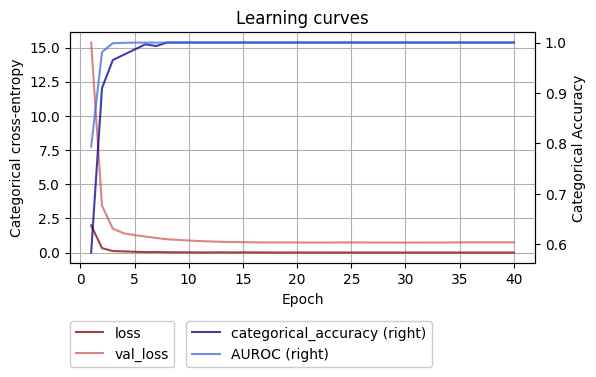

In [ ]:
# Plots the learning curves

# Create DataFrame object
df_hist = pd.DataFrame.from_dict(historyRN5.history)
df_hist["Epoch"] = np.arange(1, len(df_hist) + 1, 1)
# Plot learning curves
secondary_y = ['categorical_accuracy', 'AUROC']  #  ["AUROC", "val_AUROC"] 
ax = df_hist.plot(x="Epoch", y=['loss', 'val_loss'] + secondary_y,
                  secondary_y = secondary_y,
                  kind="line", figsize=(6, 3), grid=True, legend=True,
                  ylabel="Categorical cross-entropy", 
                  xlabel="Epoch", title="Learning curves",                  
                  color=['darkred', 'indianred', "darkblue", "royalblue"], alpha=0.75, fontsize=10)
ax.right_ax.set_ylabel("Categorical Accuracy")
ax.right_ax.legend(loc=(0.25, -0.45), framealpha=1.0)
ax.legend(loc=(0, -0.45), framealpha=1.0)
plt.show()

Adding Image Augmentation makes the results slightly worst from the previous model.

## **VGG16**

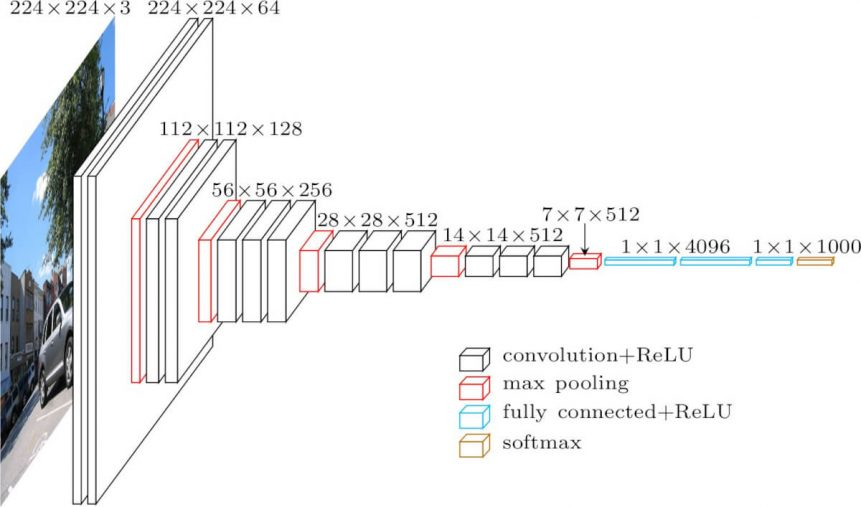

Figure Source: https://neurohive.io/en/popular-networks/vgg16/

The following model was built on the VGG16 model with the following adjustments: image augumentation, one additional hidden layer with L2 regularization and one droupout layer. 

Model Arquitecture and Compiling

In [151]:
with tf.device(device_name):
  model_VGG = Sequential()

  pretrained_model= tf.keras.applications.VGG16(include_top=False,
                    input_shape=(256, 256, 3),
                    pooling='max',classes=4,
                    weights='imagenet')

  # freeze the pre-trained layers
  for layer in pretrained_model.layers:
      layer.trainable = False

  # create the full model
  model_VGG = Sequential()
  model_VGG.add(augmentation)
  model_VGG.add(preprocessing) # Pixel normalization
  model_VGG.add(pretrained_model)
  model_VGG.add(Flatten())
  model_VGG.add(Dense(512, activation='relu', kernel_regularizer=l2(0.01)))
  model_VGG.add(Dropout(0.1))
  model_VGG.add(Dense(4, activation='softmax'))

  # compile the model
  learning_rate = 0.001  
  model_VGG.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
                  loss=tf.keras.losses.CategoricalCrossentropy(), 
                  metrics=[tf.keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),tf.keras.metrics.AUC(name='AUROC')])


Model Trainning

In [152]:
# train the model with fine-tuning
epochs = 100
historyVGG = model_VGG.fit(ds_train, epochs=epochs, validation_data=ds_val, callbacks=callbacks, verbose=1)

Epoch 1/100
9/9 [==============================] - 6s 164ms/step - loss: 6.3315 - categorical_accuracy: 0.3056 - AUROC: 0.5596 - val_loss: 5.4363 - val_categorical_accuracy: 0.5278 - val_AUROC: 0.7395
Epoch 2/100
9/9 [==============================] - 4s 129ms/step - loss: 5.2028 - categorical_accuracy: 0.4479 - AUROC: 0.6954 - val_loss: 4.7782 - val_categorical_accuracy: 0.4306 - val_AUROC: 0.7202
Epoch 3/100
9/9 [==============================] - 4s 143ms/step - loss: 4.3983 - categorical_accuracy: 0.5139 - AUROC: 0.7705 - val_loss: 4.0777 - val_categorical_accuracy: 0.5556 - val_AUROC: 0.7848
Epoch 4/100
9/9 [==============================] - 4s 131ms/step - loss: 3.7745 - categorical_accuracy: 0.5903 - AUROC: 0.8267 - val_loss: 3.6129 - val_categorical_accuracy: 0.5556 - val_AUROC: 0.7877
Epoch 5/100
9/9 [==============================] - 4s 138ms/step - loss: 3.3412 - categorical_accuracy: 0.5868 - AUROC: 0.8343 - val_loss: 3.1264 - val_categorical_accuracy: 0.6389 - val_AUROC: 0.

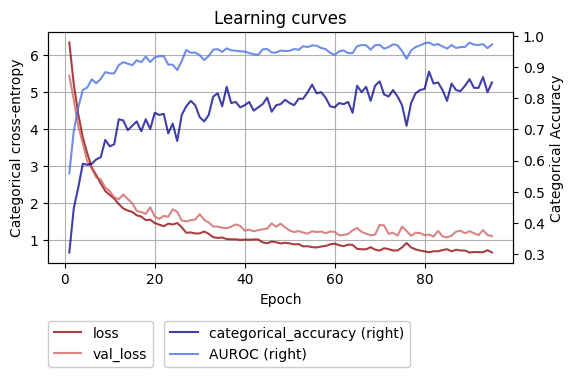

In [154]:
# Plots the learning curves

# Create DataFrame object
df_hist = pd.DataFrame.from_dict(historyVGG.history)
df_hist["Epoch"] = np.arange(1, len(df_hist) + 1, 1)
# Plot learning curves
secondary_y = ['categorical_accuracy', 'AUROC']  #  ["AUROC", "val_AUROC"] 
ax = df_hist.plot(x="Epoch", y=['loss', 'val_loss'] + secondary_y,
                  secondary_y = secondary_y,
                  kind="line", figsize=(6, 3), grid=True, legend=True,
                  ylabel="Categorical cross-entropy", 
                  xlabel="Epoch", title="Learning curves",                  
                  color=['darkred', 'indianred', "darkblue", "royalblue"], alpha=0.75, fontsize=10)
ax.right_ax.set_ylabel("Categorical Accuracy")
ax.right_ax.legend(loc=(0.25, -0.45), framealpha=1.0)
ax.legend(loc=(0, -0.45), framealpha=1.0)
plt.show()

Evaluating in Test Set

In [155]:
test_loss, test_categorical_accuracy, test_AUROC = model_VGG.evaluate(ds_test)
print('Test Loss:', test_loss)
print('Test Categorical Accuracy:', test_categorical_accuracy) 
print('Test AUROC:', test_AUROC)

2/2 [==============================] - 1s 19ms/step - loss: 1.1163 - categorical_accuracy: 0.7500 - AUROC: 0.8816
Test Loss: 1.1162713766098022
Test Categorical Accuracy: 0.75
Test AUROC: 0.8815624713897705
